In [34]:
import warnings  
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import category_encoders as ce # Encode Categorical Variables
import missingno as msno
from ydata_profiling import ProfileReport

In [35]:
pd.options.display.float_format = '{:.2f}'.format
sns.set(color_codes=True)
sns.set_style('darkgrid')
%matplotlib inline 

In [36]:
df = pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')

In [5]:
#pip install ydata-profiling

Note: you may need to restart the kernel to use updated packages.


In [6]:
#!pip install missingno

In [5]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Data Wrangling

In [37]:
df.head(10)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
5,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,...,3,80,0,8,2,2,7,7,3,6
6,59,No,Travel_Rarely,1324,Research & Development,3,3,Medical,1,10,...,1,80,3,12,3,2,1,0,0,0
7,30,No,Travel_Rarely,1358,Research & Development,24,1,Life Sciences,1,11,...,2,80,1,1,2,3,1,0,0,0
8,38,No,Travel_Frequently,216,Research & Development,23,3,Life Sciences,1,12,...,2,80,0,10,2,3,9,7,1,8
9,36,No,Travel_Rarely,1299,Research & Development,27,3,Medical,1,13,...,2,80,2,17,3,2,7,7,7,7


In [38]:
df.tail(10)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1460,29,No,Travel_Rarely,468,Research & Development,28,4,Medical,1,2054,...,2,80,0,5,3,1,5,4,0,4
1461,50,Yes,Travel_Rarely,410,Sales,28,3,Marketing,1,2055,...,2,80,1,20,3,3,3,2,2,0
1462,39,No,Travel_Rarely,722,Sales,24,1,Marketing,1,2056,...,1,80,1,21,2,2,20,9,9,6
1463,31,No,Non-Travel,325,Research & Development,5,3,Medical,1,2057,...,2,80,0,10,2,3,9,4,1,7
1464,26,No,Travel_Rarely,1167,Sales,5,3,Other,1,2060,...,4,80,0,5,2,3,4,2,0,0
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,...,1,80,0,6,3,4,4,3,1,2


In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

There are no missing values


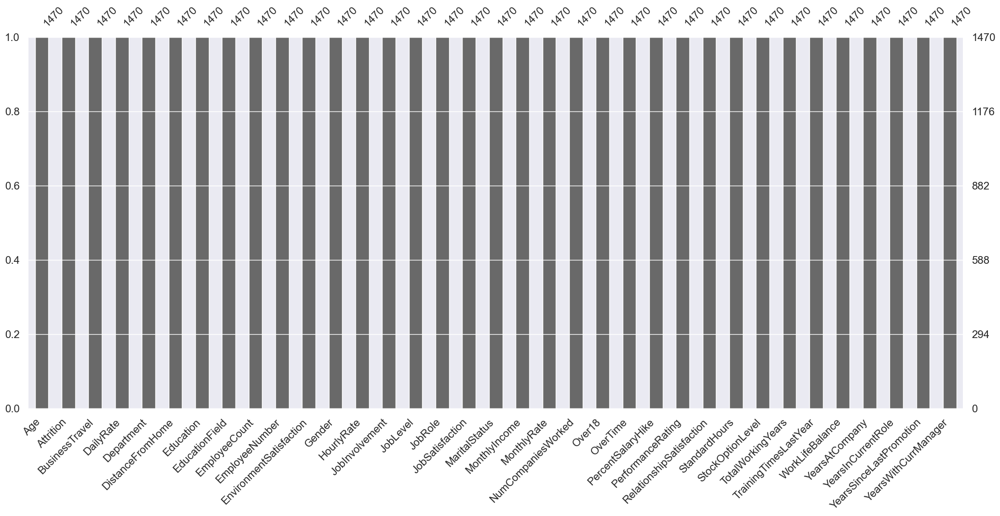

In [40]:
print('There are no missing values')
ax = msno.bar(df)

In [41]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,...,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00
mean,36.92,802.49,9.19,2.91,1.00,1024.87,2.72,65.89,2.73,2.06,...,2.71,80.00,0.79,11.28,2.80,2.76,7.01,4.23,2.19,4.12
std,9.14,403.51,8.11,1.02,0.00,602.02,1.09,20.33,0.71,1.11,...,1.08,0.00,0.85,7.78,1.29,0.71,6.13,3.62,3.22,3.57
min,18.00,102.00,1.00,1.00,1.00,1.00,1.00,30.00,1.00,1.00,...,1.00,80.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00
25%,30.00,465.00,2.00,2.00,1.00,491.25,2.00,48.00,2.00,1.00,...,2.00,80.00,0.00,6.00,2.00,2.00,3.00,2.00,0.00,2.00
50%,36.00,802.00,7.00,3.00,1.00,1020.50,3.00,66.00,3.00,2.00,...,3.00,80.00,1.00,10.00,3.00,3.00,5.00,3.00,1.00,3.00
75%,43.00,1157.00,14.00,4.00,1.00,1555.75,4.00,83.75,3.00,3.00,...,4.00,80.00,1.00,15.00,3.00,3.00,9.00,7.00,3.00,7.00
max,60.00,1499.00,29.00,5.00,1.00,2068.00,4.00,100.00,4.00,5.00,...,4.00,80.00,3.00,40.00,6.00,4.00,40.00,18.00,15.00,17.00


In [42]:
print('Total number of observations:', df.shape[0])
before_drop = df.shape[1]
print('Total number of attributes before dropping:', before_drop)

Total number of observations: 1470
Total number of attributes before dropping: 35


In [43]:
print('Columns before dropping:\n\n', df.columns)

Columns before dropping:

 Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')


#### Dropping irrelevant columns 

In [44]:
# Removing the unnecassary features from the dataset which are not relavent or add redundancy.

df.drop(['BusinessTravel','DailyRate', 'Education', 'EmployeeCount','EmployeeNumber','HourlyRate','MonthlyRate'
           ,'NumCompaniesWorked','Over18','StandardHours', 'StockOptionLevel','TrainingTimesLastYear'],axis=1,inplace=True)

In [45]:
print('Columns after dropping:\n\n', df.columns)

Columns after dropping:

 Index(['Age', 'Attrition', 'Department', 'DistanceFromHome', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'JobInvolvement', 'JobLevel',
       'JobRole', 'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome',
       'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'TotalWorkingYears', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')


In [46]:
print('Total number of attributes before dropping:', before_drop)
print('Total number of attributes after dropping:', df.shape[1])

Total number of attributes before dropping: 35
Total number of attributes after dropping: 23


In [47]:
# if the number of unique values is less than 20 then the variable is likely to be categorical otherwise continuous.
df.nunique()

Age                           43
Attrition                      2
Department                     3
DistanceFromHome              29
EducationField                 6
EnvironmentSatisfaction        4
Gender                         2
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
TotalWorkingYears             40
WorkLifeBalance                4
YearsAtCompany                37
YearsInCurrentRole            19
YearsSinceLastPromotion       16
YearsWithCurrManager          18
dtype: int64

# Exploratory Data Analysis

### Target Variable - Binary Classification

In [48]:
print('Unique values in the target variable',df['Attrition'].unique())

Unique values in the target variable ['Yes' 'No']


No     1233
Yes     237
Name: Attrition, dtype: int64


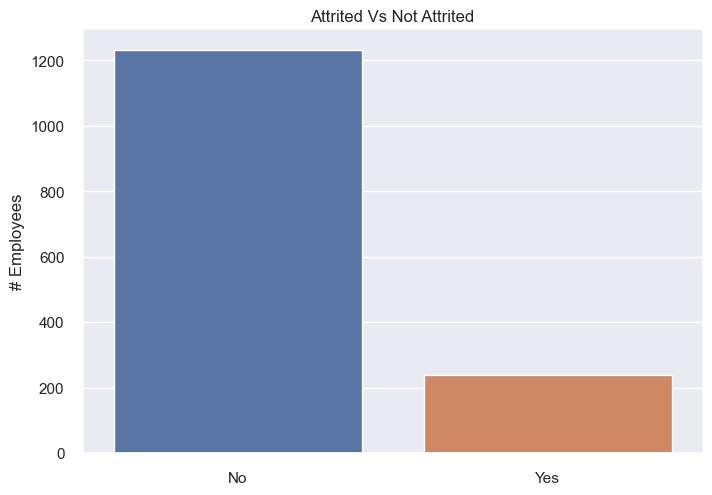

In [49]:
target_variable = df['Attrition'].value_counts()

sns.barplot(x = target_variable.index, y = target_variable)
plt.title('Attrited Vs Not Attrited')
plt.ylabel('# Employees')
print(target_variable)

### Overview of the total values for each Categorical Values

In [50]:
cat_var = ['Attrition','Department', 'EducationField',
           'Gender','JobRole','MaritalStatus', 'OverTime']

for i in cat_var:
    print(i) # print column name
    print(df[i].value_counts()) # count the number of occurrences of each unique value in the column

Attrition
No     1233
Yes     237
Name: Attrition, dtype: int64
Department
Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64
EducationField
Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64
Gender
Male      882
Female    588
Name: Gender, dtype: int64
JobRole
Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64
MaritalStatus
Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64
OverTime
No     1054
Yes     416
Name: OverTime, dtype: int64


### Overview of the % for each Categorical Values

In [51]:
cat_var = ['Attrition','Department', 'EducationField',
           'Gender','JobRole','MaritalStatus', 'OverTime']

for i in cat_var:
    print(i)
    print(df[i].value_counts(normalize=True) * 100)

# https://pandas.pydata.org/pandas-docs/version/0.25.1/reference/api/pandas.Series.value_counts.html#:~:text=With%20normalize%20set%20to%20True,by%20the%20sum%20of%20values.&text=Bins%20can%20be%20useful%20for,number%20of%20half%2Dopen%20bins.

Attrition
No    83.88
Yes   16.12
Name: Attrition, dtype: float64
Department
Research & Development   65.37
Sales                    30.34
Human Resources           4.29
Name: Department, dtype: float64
EducationField
Life Sciences      41.22
Medical            31.56
Marketing          10.82
Technical Degree    8.98
Other               5.58
Human Resources     1.84
Name: EducationField, dtype: float64
Gender
Male     60.00
Female   40.00
Name: Gender, dtype: float64
JobRole
Sales Executive             22.18
Research Scientist          19.86
Laboratory Technician       17.62
Manufacturing Director       9.86
Healthcare Representative    8.91
Manager                      6.94
Sales Representative         5.65
Research Director            5.44
Human Resources              3.54
Name: JobRole, dtype: float64
MaritalStatus
Married    45.78
Single     31.97
Divorced   22.24
Name: MaritalStatus, dtype: float64
OverTime
No    71.70
Yes   28.30
Name: OverTime, dtype: float64


### Encoding Categorical variables into numerical variables

In [52]:
# Select categorical columns
cat_var = ['Attrition','Department', 'EducationField',
           'Gender','JobRole','MaritalStatus', 'OverTime']

# Define the encoder
encoder = ce.OrdinalEncoder(cols=cat_var, return_df=True)

# Fit and transform the encoder on the entire dataset
encoded_cat_var = encoder.fit_transform(df)

In [53]:
# Making these changes permanent
df[cat_var] = encoded_cat_var[cat_var]

In [54]:
# Data after encoding categorical variables
df.head()

,Age,Attrition,Department,DistanceFromHome,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,JobRole,...,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,TotalWorkingYears,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,1,1,1,2,1,3,2,1,...,1,11,3,1,8,1,6,4,0,5
1,49,2,2,8,1,3,2,2,2,2,...,2,23,4,4,10,3,10,7,1,7
2,37,1,2,2,2,4,2,2,1,3,...,1,15,3,2,7,3,0,0,0,0
3,33,2,2,3,1,4,1,3,1,2,...,1,11,3,3,8,3,8,7,3,0
4,27,2,2,2,3,1,2,3,1,3,...,2,12,3,4,6,3,2,2,2,2


#### Dictionary to map the encoded values to their original categories for better interpretation of the information

In [55]:
attrition_dict = {2: 'No', 1: 'Yes'}

department_dict = {1:'Sales', 2: 'Research & Development', 3: 'Human Resources'}

educationfield_dict = {6:'Human Resources', 1: 'Life Sciences', 4: 'Marketing',
                       3:'Medical', 2:'Other', 5:'Technical Degree'}

gender_dict = {1: 'Female', 2: 'Male'}

jobrole_dict = {1:'Sales Executive', 2:'Research Scientist', 3:'Laboratory Technician',
                4:'Manufacturing Director', 5:'Healthcare Representative', 6:'Manager',
                7:'Sales Representative', 8:'Research Director', 9:'Human Resources'}

marital_dict = {2:'Married', 1:'Single', 3:'Divorced'}

overtime_dict = {2: 'No', 1: 'Yes'}

#### Subsets with employees still working at IBM and employees who left IBM

In [56]:
attrition_no = df[df['Attrition'] == 'No']
attrition_yes = df[df['Attrition'] == 'Yes']

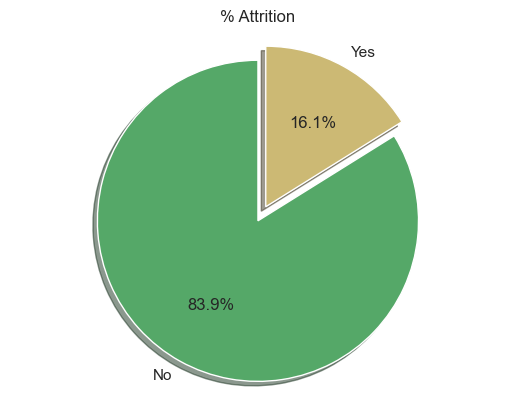

In [29]:
# Pie chart to display the percentage Existing and Attrited customers
# It is evident that around 16% of the customers have churned or exited.

df['Attrition'] = df['Attrition'].replace(attrition_dict)
attrition_label = df['Attrition'].value_counts()

explode = (0.1,0)

plt.pie(attrition_label.values,
        labels=attrition_label.index,
        autopct='%1.1f%%',
        explode=explode,
        startangle=90,        
        shadow=True,
        colors=['g', 'y'])
plt.axis('equal') # Equal aspect ratio ensures the pie chart is circular.
plt.title('% Attrition')

plt.show()

# https://problemsolvingwithpython.com/06-Plotting-with-Matplotlib/06.06-Bar-Charts-and-Pie-Charts/

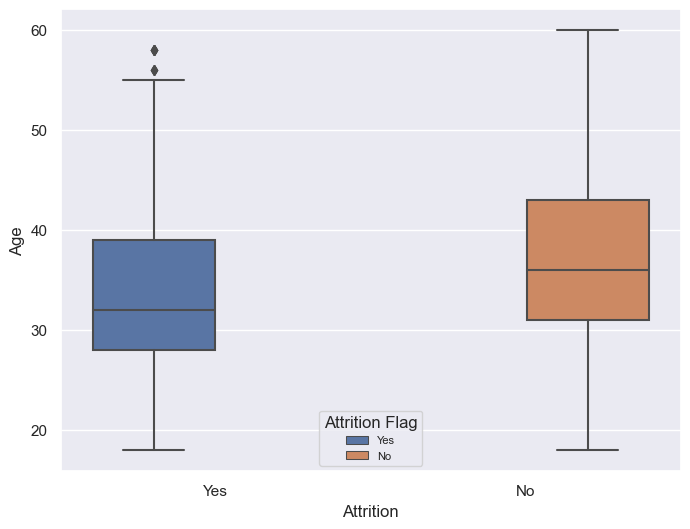

In [64]:
# The older customers are more likely to churn from the bank. 

fig, ax = plt.subplots(figsize=(8,6))
sns.boxplot(data=df, x ='Attrition', y ='Age', hue ='Attrition')
ax.legend(title='Attrition Flag', fontsize=8)
        
plt.show()

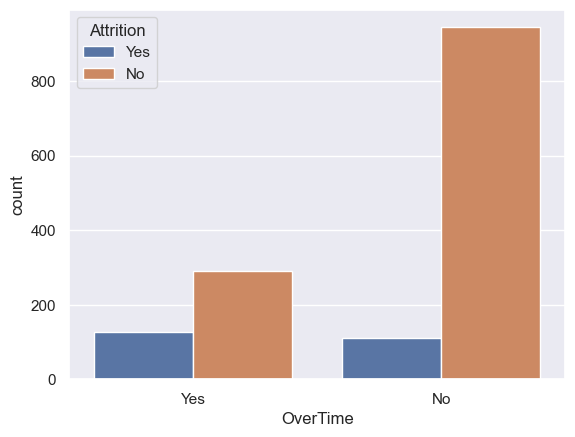

In [65]:
df['OverTime'] = df['OverTime'].replace(overtime_dict)

sns.countplot(data=df, x='OverTime', hue='Attrition')
plt.show()

#sns.countplot(x=educationfield_map,data = df, hue=attrition_map, palette='Set2')

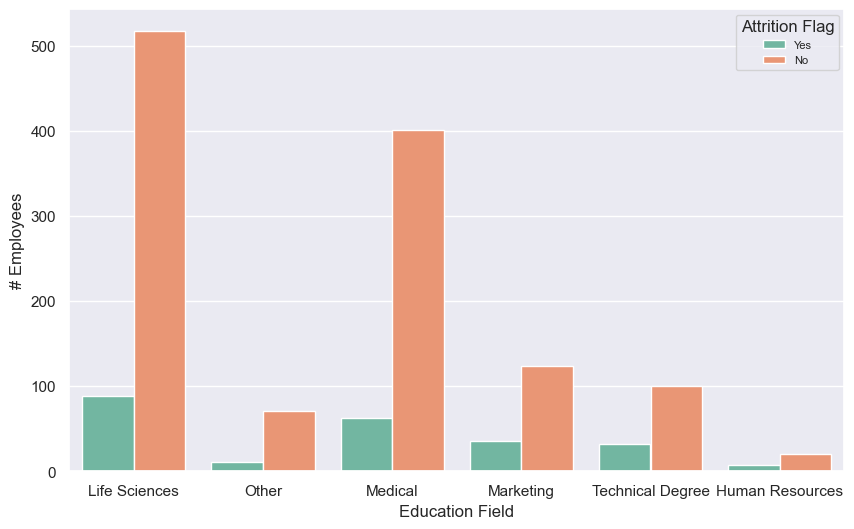

In [66]:
# Most of the Existing Customers are 'Graduate'

df['EducationField'] = df['EducationField'].replace(educationfield_dict)

plt.figure(figsize=(10,6))
sns.countplot(x='EducationField',data = df, hue='Attrition', palette='Set2')
plt.xlabel('Education Field')
plt.ylabel('# Employees')
plt.legend(title='Attrition Flag', fontsize=8);

# https://seaborn.pydata.org/generated/seaborn.countplot.html

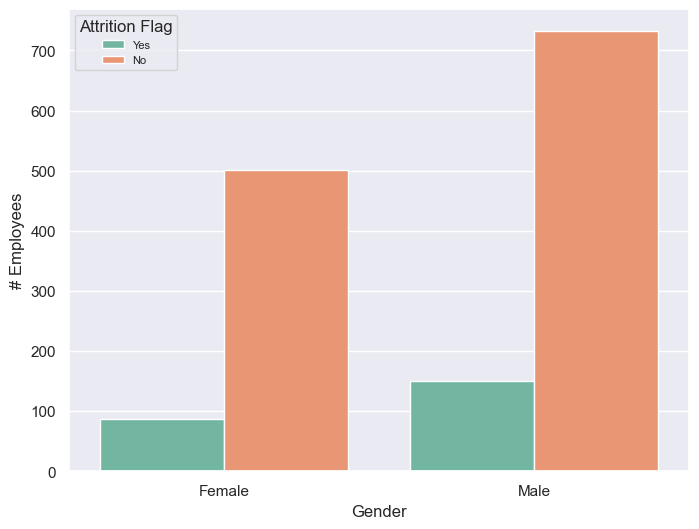

In [67]:
# Both M and F are similiar

df['Gender'] = df['Gender'].replace(gender_dict)

plt.figure(figsize=(8,6))
sns.countplot(x='Gender',data = df, hue='Attrition', palette='Set2')
plt.ylabel('# Employees')
plt.legend(title='Attrition Flag', fontsize=8);

# https://seaborn.pydata.org/generated/seaborn.countplot.html

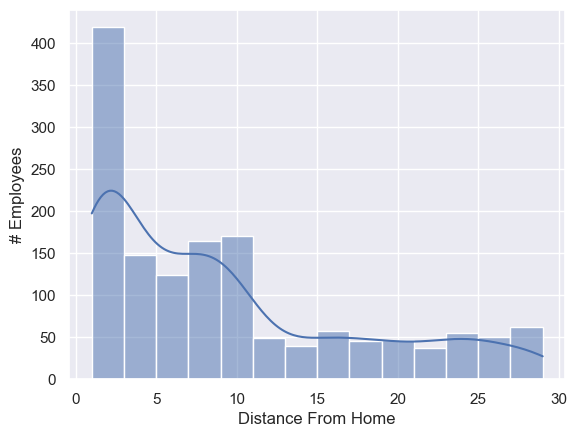

In [68]:
sns.histplot(data=df, x='DistanceFromHome', kde=True)
plt.xlabel('Distance From Home')
plt.ylabel('# Employees');

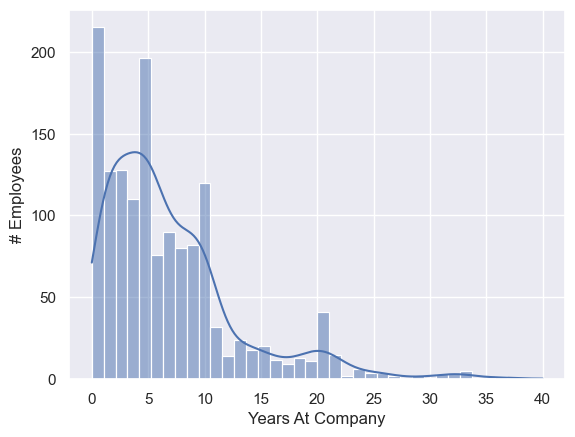

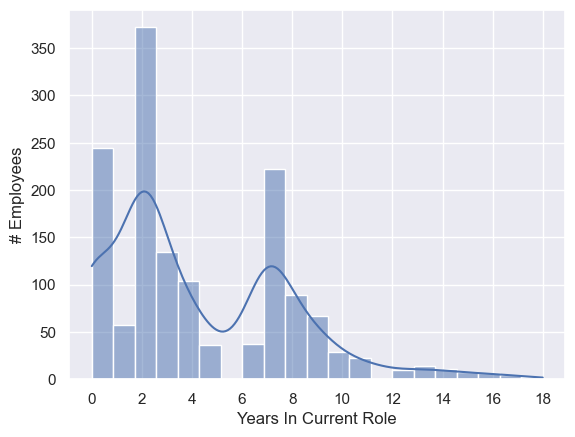

In [69]:
sns.histplot(data=df, x='YearsAtCompany', kde=True)
plt.xlabel('Years At Company')
plt.ylabel('# Employees')
plt.show()

sns.histplot(data=df, x='YearsInCurrentRole', kde=True)
plt.xlabel('Years In Current Role')
plt.ylabel('# Employees')
plt.xticks(range(0, max(df['YearsInCurrentRole'])+1, 2))

plt.show()

# https://stackoverflow.com/questions/12608788/changing-the-tick-frequency-on-the-x-or-y-axis
# https://towardsdatascience.com/change-tick-frequency-matplotlib-axis-6af2c6bce1ea

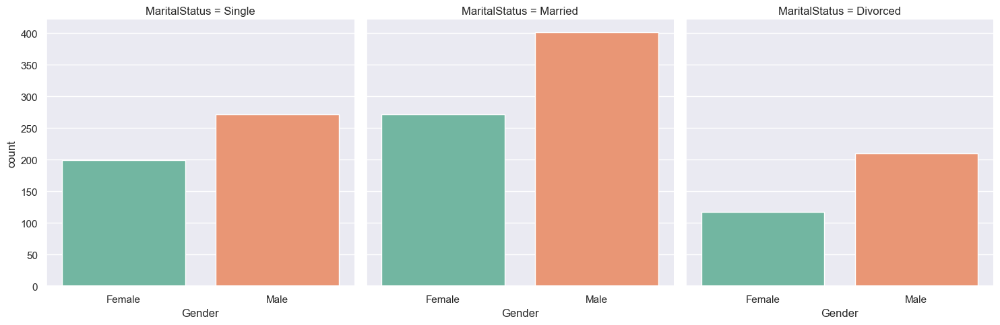

In [70]:
df['MaritalStatus'] = df['MaritalStatus'].replace(marital_dict)

sns.catplot(x='Gender', data=df, palette = 'Set2', kind='count', col='MaritalStatus');

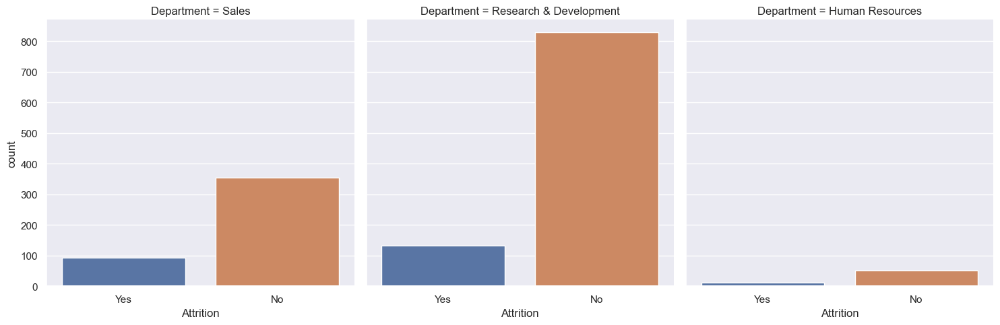

In [71]:
df['Department'] = df['Department'].replace(department_dict)

sns.catplot(data=df, kind='count', x='Attrition', col='Department');

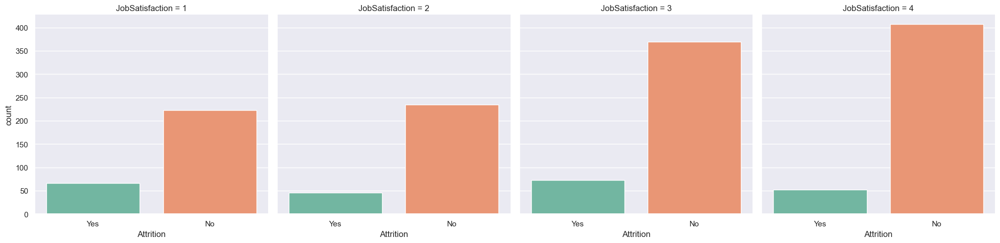

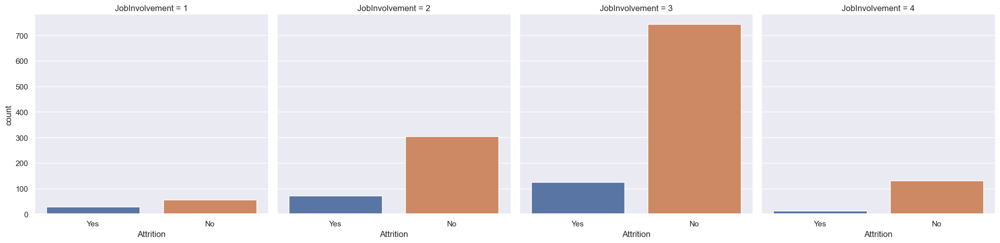

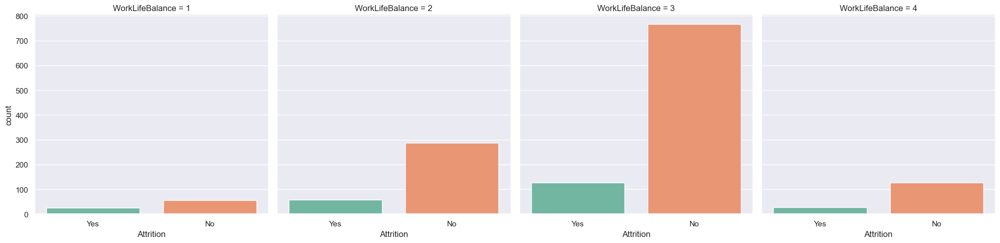

In [72]:
sns.catplot(data=df,kind='count',x='Attrition',col='JobSatisfaction',palette = 'Set2')

sns.catplot(data=df,kind='count',x='Attrition',col='JobInvolvement')

sns.catplot(data=df,kind='count',x='Attrition',col='WorkLifeBalance',palette = 'Set2');

# https://seaborn.pydata.org/generated/seaborn.catplot.html

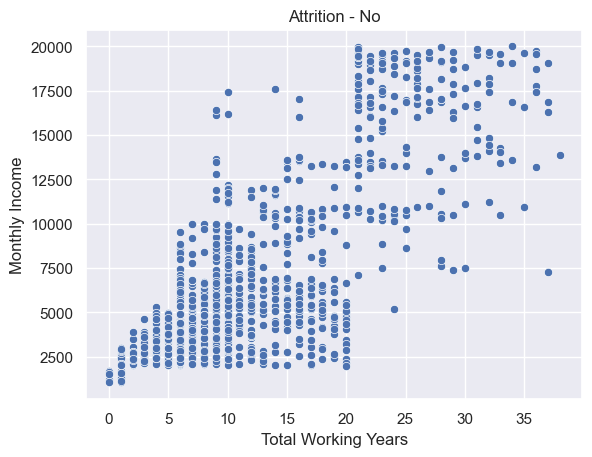

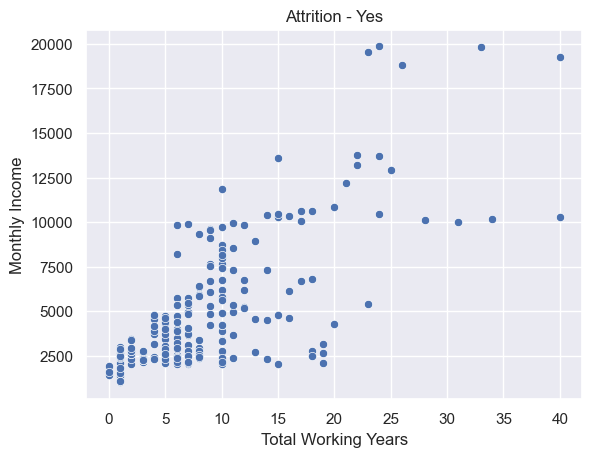

In [75]:
sns.scatterplot(data=attrition_no, x='TotalWorkingYears', y='MonthlyIncome')
plt.xlabel('Total Working Years')
plt.ylabel('Monthly Income')
plt.title('Attrition - No')
plt.show()

sns.scatterplot(data=attrition_yes, x='TotalWorkingYears', y='MonthlyIncome')
plt.xlabel('Total Working Years')
plt.ylabel('Monthly Income')
plt.title('Attrition - Yes')
plt.show()

{1: 'Sales Executive', 2: 'Research Scientist', 3: 'Laboratory Technician', 4: 'Manufacturing Director', 5: 'Healthcare Representative', 6: 'Manager', 7: 'Sales Representative', 8: 'Research Director', 9: 'Human Resources'}


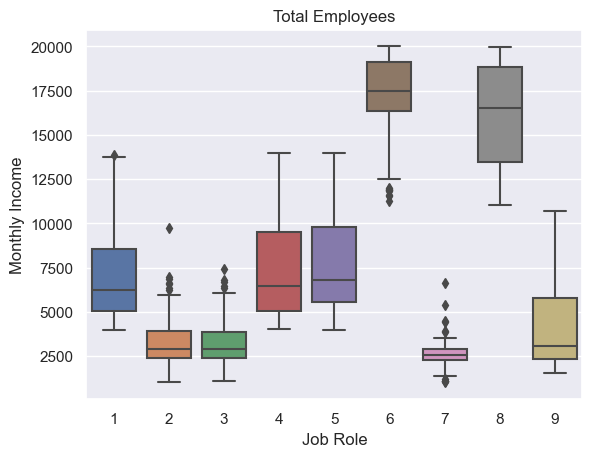

In [76]:
sns.boxplot(data=df, x='JobRole', y='MonthlyIncome')
plt.xlabel('Job Role')
plt.ylabel('Monthly Income')
plt.title('Total Employees');

print(jobrole_dict)

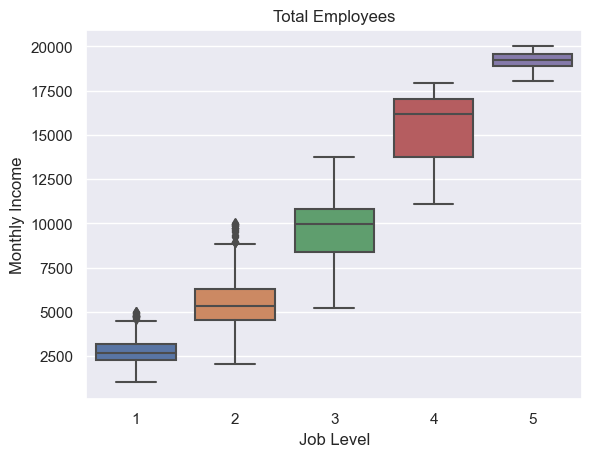

In [77]:
sns.boxplot(data=df, x='JobLevel', y='MonthlyIncome')
plt.xlabel('Job Level')
plt.ylabel('Monthly Income')
plt.title('Total Employees');

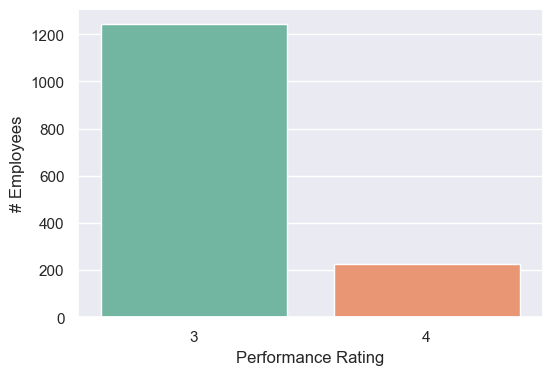

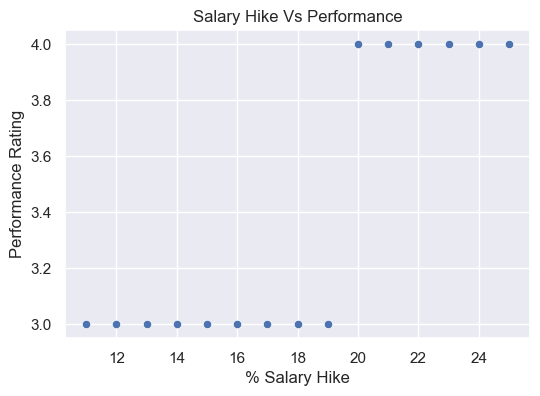

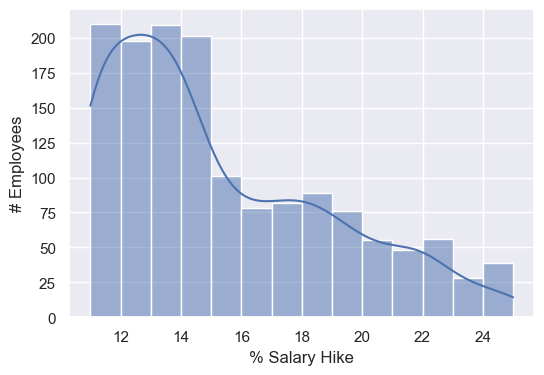

3    1244
4     226
Name: PerformanceRating, dtype: int64

In [78]:
plt.figure(figsize=(6,4))
sns.countplot(x='PerformanceRating',data = df, palette='Set2')
plt.xlabel('Performance Rating')
plt.ylabel('# Employees');

plt.figure(figsize=(6,4))
sns.scatterplot(data=df, x='PercentSalaryHike', y='PerformanceRating')
plt.xlabel('% Salary Hike')
plt.ylabel('Performance Rating')
plt.title('Salary Hike Vs Performance')
plt.show()

plt.figure(figsize=(6,4))
sns.histplot(data=df, x='PercentSalaryHike', kde=True)
plt.xlabel('% Salary Hike')
plt.ylabel('# Employees')
plt.show()

df['PerformanceRating'].value_counts()

# Statistical Techniques

In [25]:
# Importing Libraries
import statistics as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols # Linear samples
from scipy import stats
import scipy as scipy
from scipy.stats import levene # Homogeinity of variance: Levene's test
import scipy.stats as st # Confidence Interval

#### Central Tendency Metrics for Attrition

In [65]:
# Mean Working Years attrition 'Yes'
mean_work_yes = attrition_yes['TotalWorkingYears'].mean()
# Mean Working Years attrition 'No'
mean_work_no = attrition_no['TotalWorkingYears'].mean()

# Median Montly Income attrition 'Yes'
median_inc_yes = attrition_yes['MonthlyIncome'].median()
# Median Monthly Income attrition 'No'
median_inc_no = attrition_no['MonthlyIncome'].median()

# Mode for AGE attrition 'Yes'
mode_age_yes = attrition_yes['Age'].mode()
# Mode for AGE attrition 'No'
mode_age_no = attrition_no['Age'].mode()

print('Working Years Mean "Yes": {:.1f}'.format(mean_work_yes))
print('Working Years Mean "No": {:.1f}'.format(mean_work_no))
print('\nMonthly Income Median "Yes":',median_inc_yes)
print('Monthly Income Median "No":',median_inc_no)
print('\nAge Attrition Mode "Yes"\n', mode_age_yes)
print('\nAge Attrition Mode "No"\n', mode_age_no)

Working Years Mean "Yes": 8.2
Working Years Mean "No": 11.9

Monthly Income Median "Yes": 3202.0
Monthly Income Median "No": 5204.0

Age Attrition Mode "Yes"
 0    29
1    31
Name: Age, dtype: int64

Age Attrition Mode "No"
 0    34
1    35
Name: Age, dtype: int64


#### Mesures of Dispersion: Variance and STD Metrics for Attrition

In [103]:
# Variance & STD Working Years - Attrition 'Yes'
var_work_yes = attrition_yes['TotalWorkingYears'].var()
std_work_yes = attrition_yes['TotalWorkingYears'].std()
# Variance & STD Working Years - Attrition 'No
var_work_no = attrition_no['TotalWorkingYears'].var()
std_work_no = attrition_no['TotalWorkingYears'].std()
# Variance & STD Monthly Income - Attrition 'Yes'
var_inc_yes = attrition_yes['MonthlyIncome'].var()
std_inc_yes = attrition_yes['MonthlyIncome'].std()
# Variance & STD Monthly Income - Attrition 'No'
var_inc_no = attrition_no['MonthlyIncome'].var()
std_inc_no = attrition_no['MonthlyIncome'].std()
# Variance & STD Age - Attrition 'Yes'
var_age_yes = attrition_yes['Age'].var()
std_age_yes = attrition_yes['Age'].std()
# Variance & STD Age - Attrition 'No'
var_age_no = attrition_no['Age'].var()
std_age_no = attrition_no['Age'].std()

print('Total Working Years\n')
print('Variance "Yes":',var_work_yes)
print('Variance "No":',var_work_no)
print('STD "Yes":',std_work_yes)
print('STD "No":',std_work_no)

print('\nMonthly Income\n')
print('Variance "Yes":',var_inc_yes)
print('Variance "No":',var_inc_no)
print('STD "Yes":',std_inc_yes)
print('STD "No":',std_inc_no)

print('\nAge\n')
print('Variance "Yes":',var_age_yes)
print('Variance "No":',var_age_no)
print('STD "Yes":',std_age_yes)
print('STD "No":',std_age_no)

Total Working Years

Variance "Yes": 51.39748265751274
Variance "No": 60.22876312657349
STD "Yes": 7.169203767330981
STD "No": 7.760719240287815

Monthly Income

Variance "Yes": 13251131.516770355
Variance "No": 23215128.338823628
STD "Yes": 3640.2103671038512
STD "No": 4818.208000784485

Age

Variance "Yes": 93.88350139455049
Variance "No": 79.00294393360106
STD "Yes": 9.689349895351622
STD "No": 8.888360024976546


## ANOVA

* We are analysing numerical and categorical variables (Age is numerical and Department is categorical)


### Checking the ANOVA conditions

* It is slightly skewed
* It does not have to be exaclty symmetric 
* If its approximatley normal we are still good to go
* The problem with this hypothesis test is that is higlhy affected by outliers

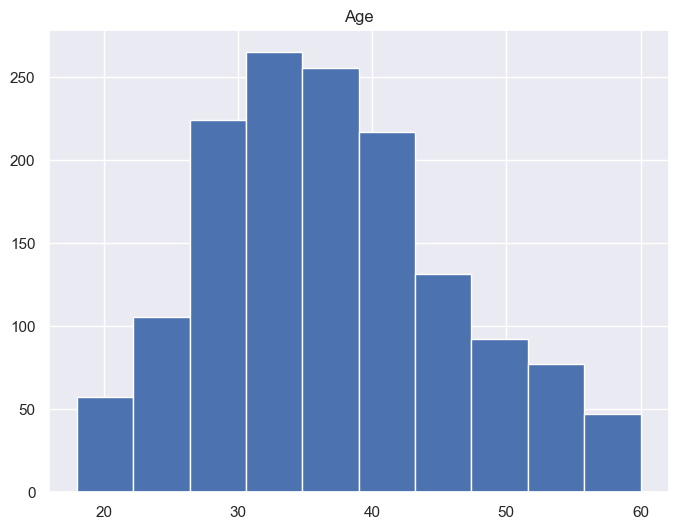

In [84]:
# It is a bit skewed
df.hist(column='Age', figsize=(8,6));

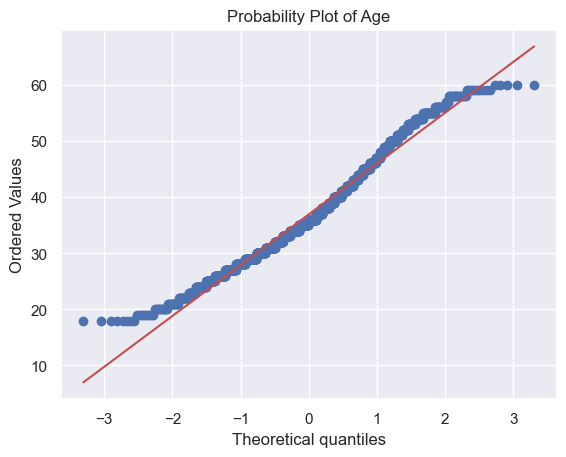

<Figure size 640x480 with 0 Axes>

In [105]:
# Normality plot. Our variable is "Age"

# if the dots are far from the line, its likely not to be normal data
# To be normal data the dots have be close to the line
# we assume that with this plot our data is normal

stats.probplot(df.Age, plot=plt)
plt.title('Probability Plot of Age')
plt.figure();

### Shapiro wilk test
* H0 = data comes from normal distribution
* H1 = data did not come from normal distribution

In [87]:
df['Department'].value_counts()

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64

In [86]:
#Shapiro wilk test

shapiro_rd = stats.shapiro(df.Age[df.Department == 'Research & Development'])
shapiro_sales = stats.shapiro(df.Age[df.Department == 'Sales'])
shapiro_rrhh = stats.shapiro(df.Age[df.Department == 'Human Resources'])

print('Research & Development:\n',shapiro_rd)
print('\nSales:\n',shapiro_sales)
print('\nHuman Resources:\n',shapiro_rrhh) 

Research & Development:
 ShapiroResult(statistic=0.9774771332740784, pvalue=4.86336214355898e-11)

Sales:
 ShapiroResult(statistic=0.974335789680481, pvalue=4.57448635415858e-07)

Human Resources:
 ShapiroResult(statistic=0.9746187329292297, pvalue=0.2176036834716797)


* if p value < alpha ---> we reject H0
* if p-value > alpha ---> we accept H0

 ----------------------------------------------------
 
* Research & Development p-value < 0.05
* Sales: p-value < 0.05
* Human Resources: p-value > 0.05

In this case, only one out of three categories (RRHH) is normally distributed according to the Shapiro-Wilk test results

#### LEVENE 

* It is to test the null hypothesis (H0) that all input samples have equal variances.

In [131]:
research = df[df.Department == 'Research & Development'].Age
sales = df[df.Department == 'Sales'].Age
rrhh = df[df.Department == 'Human Resources'].Age

In [114]:
# I want to see if the variances are equal across the different departments and the data is centered

levene(research, sales, rrhh, center = 'mean')

LeveneResult(statistic=0.1638235405638918, pvalue=0.8489073315847732)

 In this case, p-value is greater than alpha (0.05), then we accept the null hypothesis and therefore
 ----> we can say that the variances are equal.

 pvalue=0.8489073315847732 accept the null hypothesis (H0) ---> the variances between ages are equal.
 --->  the variances of the age distributions are equal for all departments. 
 ---> Therefore, we can proceed with ANOVA assuming equal variances.

### ANOVA ONE-WAY 

In [125]:
model = ols('Age~Department', data = df).fit()  # Type 2 the quality 
anova = sm.stats.anova_lm(model, type=2) # AGE~DEPARTMENT (Vs)
print(anova)

                df    sum_sq  mean_sq    F  PR(>F)
Department    2.00    127.81    63.91 0.77    0.47
Residual   1467.00 122467.66    83.48  NaN     NaN


###### if p value < alpha ---> we reject H0
###### if p-value > alpha ---> we accept H0

p-value > alpha, therefore we accept H0

At 5% significance level, there is no evidence to say that there are differences in the Age across the 3 departments

I did not perform ANOVA TWO-WAYS as the sample size is not equal.

## T-Test, one population

#### Average Salary in Ireland

* I want to check the average salary of the employees at IMB. As a data analyst, I need to know if the Monthly Income is, in average 6200, to suggest the management wheather to provide a pay rise or not to the staff. For that reason, I will take the Montly Income for all the employees to perfomr a test and prove the claim at a 5% significance level.

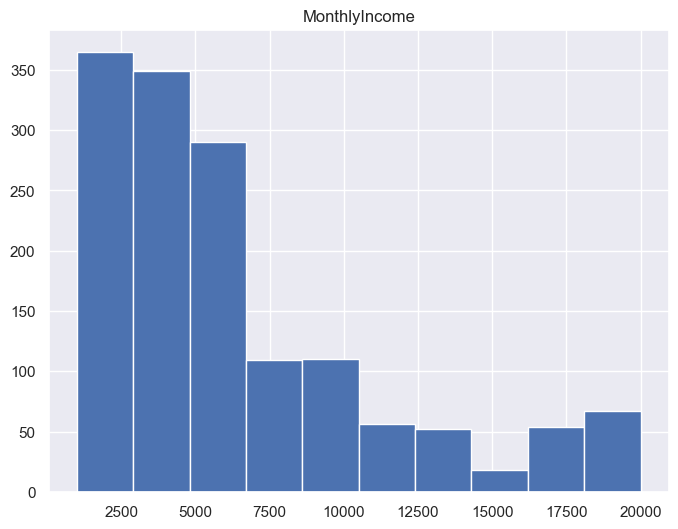

In [106]:
df.hist(column='MonthlyIncome', figsize=(8,6));

In [107]:
# Define the variable 
# income = Monthly Salary of the group (in euros)

income = df['MonthlyIncome']; income

0       5993
1       5130
2       2090
3       2909
4       3468
        ... 
1465    2571
1466    9991
1467    6142
1468    5390
1469    4404
Name: MonthlyIncome, Length: 1470, dtype: int64

In [115]:
#H0 : u = 6200
#H1 : u =! 6200
#stats.ttest_1samp(income,mu of H0)

stats.ttest_1samp(income,6200)


# Since the p-value is less than the significance level of 0.05 - pvalue=0.01373815409484002

Ttest_1sampResult(statistic=2.4670067494460888, pvalue=0.01373815409484002)

I reject H0, thus, I can conclude that there is enough evidence to say that the average Monthly Income is not 6200.

##### Suppose that I also want to know if the salary is, in average, grater than 6000 per month. Calculate the test at a 5% significance level.

* H0: u = 6000
* H1: u > 6000

* stats.t.sf (we copy the T that we got from before, degrees of freedom)

In [116]:
stats.t.sf(2.4670067494460888, len(df['MonthlyIncome']) - 1)

0.00686907704742001

p-value is less than the significance level of 0.05 - pvalue=0.00686907704742001

The p-value is less than 0.05, which means that we reject H0 and conclude that there is enough evidence to support that the average income at IBM is greater than 6000 per month calculated at a 5% significance level.

## Confidence Interval

### Gender Pay Gap

In [124]:
# Import data from tab 'Males'

males = pd.read_excel('WA_Fn-UseC_-HR-Employee-Attrition.xlsx', sheet_name = 'Males')
males

,Gender,JobRole,MonthlyIncome
0,Male,Research Scientist,24907
1,Male,Laboratory Technician,2396
2,Male,Laboratory Technician,16632
3,Male,Laboratory Technician,11864
4,Male,Laboratory Technician,13335
...,...,...,...
877,Male,Laboratory Technician,12290
878,Male,Healthcare Representative,21457
879,Male,Manufacturing Director,5174
880,Male,Sales Executive,13243


In [125]:
males.describe()

,MonthlyIncome
count,882.00
mean,14072.11
std,7125.07
min,2097.00
25%,7752.75
50%,13954.00
75%,20351.50
max,26999.00


In [126]:
# Creating confidence interval for males income
males_income = males.iloc[:,2].values
males_income

array([24907,  2396, 16632, 11864, 13335,  8787, 16577, 16479, 15170,
        8758, 12947, 15053,  7324,  4306,  6986, 19281, 17102, 21173,
        6670, 19121, 16117,  3335,  3020,  3810, 10910, 10558,  2975,
       10034, 10227, 20445,  4892, 19294, 11179,  8302, 11031,  9528,
        2689, 10877, 22656, 18787,  5868, 21777,  4956, 18775,  7346,
       23016, 15067, 25258, 10425, 15998, 26278, 18092, 17736, 21698,
        9518, 18725, 15830, 13596, 14115,  8423,  3142, 24301,  8863,
       24409, 25043, 23648, 15178, 15850, 26959, 26897, 22887, 13257,
       14506, 19494, 22310, 15480,  6462, 20739, 26820, 19299, 21196,
        2819, 25150, 24835, 13982,  9752, 22812, 11162, 12888,  6961,
       11439, 16047, 10901, 26283, 13983,  8552, 11992,  5970,  6672,
       23402, 25326,  4609, 12430, 13364, 15062, 11012, 10515,  9241,
        3425, 13339, 14074,  5678, 15497,  5228, 20462, 22977,  7259,
        4185,  9679, 23793,  5972, 16523, 11354, 12392, 14242, 12368,
       25812, 20925,

In [133]:
males_mean = males_income.mean()
print('Income mean for "Males":',males_mean)

Income mean for "Males": 14072.105442176871


In [134]:
st.t.interval(alpha=0.95, df=len(males_income)-1, loc=np.mean(males_income), scale=st.sem(males_income))

(13601.236347521271, 14542.974536832471)

The interval Monthly Income for Males at IBM is between 13,601.24 and 14,542,97

In [135]:
# Import data from tab 'Females'

females = pd.read_excel('WA_Fn-UseC_-HR-Employee-Attrition.xlsx', sheet_name = 'Females')
females

,Gender,JobRole,MonthlyRate
0,Female,Sales Executive,19479
1,Female,Research Scientist,23159
2,Female,Laboratory Technician,9964
3,Female,Laboratory Technician,12682
4,Female,Manufacturing Director,10195
...,...,...,...
583,Female,Research Scientist,12549
584,Female,Research Scientist,8952
585,Female,Research Scientist,8489
586,Female,Sales Executive,8828


In [136]:
females.describe()

,MonthlyRate
count,588.00
mean,14674.60
std,7097.55
min,2094.00
25%,8373.75
50%,14927.50
75%,20948.00
max,26997.00


In [137]:
# Creating confidence interval for females income
females_income = females.iloc[:,2].values
females_income

array([19479, 23159,  9964, 12682, 10195, 22021,  8232, 21293, 10735,
        4681,  2094, 22822, 21923,  9687, 13072,  3193, 19715, 10781,
       16280,  4009, 21436, 15146, 16002,  5456, 16701,  2354,  8202,
       19730, 24668, 22002, 20682, 15717, 19760, 24001, 17519, 19783,
       12482, 21922,  9755, 23785, 25796, 13871, 15000,  5615, 22952,
        2561,  4510, 23300,  3465,  5549, 16090,  6645, 24788,  8916,
       14590, 10224,  2302, 23910, 10415, 16102,  8504, 15589, 11873,
       11314, 17053,  8053, 12930, 20989,  6319, 13939,  2137,  6319,
        6984,  5711, 21728, 26250,  4673,  6499,  7192, 11781, 15986,
       16439, 24525,  7703, 12916,  8556, 14674, 22967, 16840, 17011,
       13248,  6599,  9096,  3300, 24118,  7744, 21509, 20990, 15417,
       14776, 18697,  6420, 23016,  7505,  8007, 14977, 11677, 19100,
       19191, 26767, 15881,  4488, 25594,  3909, 14864,  9724,  6927,
       26707, 23364, 10675, 17810, 20938, 24624, 10557, 11934, 14034,
       17778,  6227,

In [138]:
females_mean = females_income.mean()
print('Income mean for "Females":',females_mean)

Income mean for "Females": 14674.600340136054


In [139]:
st.t.interval(alpha=0.95, df=len(females_income)-1, loc=np.mean(females_income), scale=st.sem(females_income))

(14099.737311301811, 15249.463368970297)

The interval Monthly Income for Females at IBM is between 14,099.74 and 15,249.46

In [148]:
gen_pay_gap = ((females_mean - males_mean)/males_mean)*100
print('Gender Pay Gap: {:.3}%'.format(gen_pay_gap))

Gender Pay Gap: 4.28%


### Correlations among features

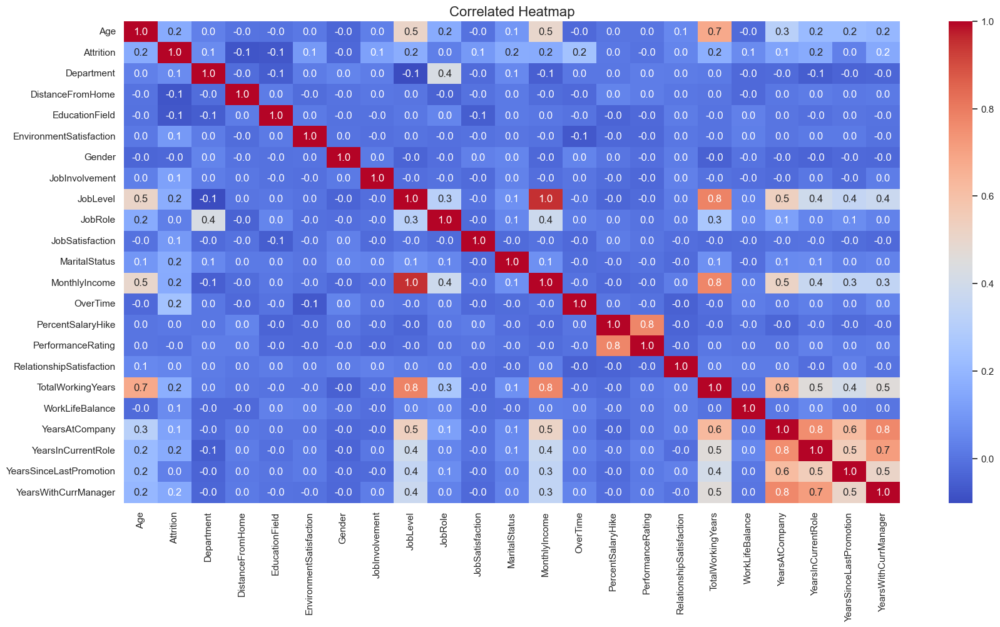

In [25]:
# Positive correlation (closer to 1) means that the two features tend to increase or decrease together.
# Negative correlation (closer to -1) means that the two features tend to have an inverse relationship

plt.figure(figsize=(20,10))
correlation = df.corr()
heatmap = sns.heatmap(correlation, vmin=None, cmap='coolwarm', annot=True, fmt='.1f')
heatmap.set_title('Correlated Heatmap', fontdict={'fontsize': 16});

# https://medium.com/@szabo.bibor/how-to-create-a-seaborn-correlation-heatmap-in-python-834c0686b88e

# Machine Learning

* #####  I will be using the employees data to predict whether an employee will leave or not the company.

#### Splitting the Data-Set into Training Set and Test Set
Data is divided into the Train set and Test set. We use the Train set to make the algorithm learn the data’s behavior and then check the accuracy of our model on the Test set.
Features (X): The columns that are inserted into our model will be used to make predictions.
Prediction (y): Target variable that will be predicted by the features.

-------------------------------------
I will repeat this process three times with different test set sizes (10%, 20%, and 30%) and then apply Confusion Matrix and Classificaion Report to evaluate the performance of my models on each of these splits.

In [216]:
# pip install dtreeviz

Note: you may need to restart the kernel to use updated packages.


In [217]:
# pip install yellowbrick

Note: you may need to restart the kernel to use updated packages.


In [57]:
import dtreeviz
from yellowbrick.model_selection import FeatureImportances

#### Import relevant libraries from sklearn

In [58]:
from sklearn.ensemble import RandomForestClassifier #Import Random Forest Model
from sklearn.svm import SVC
from sklearn import svm # Import the library for the model named as 'SVM'

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split # Import train_test_split function

from sklearn import metrics # Import the library for accuracy, precision and recall
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score

# SMOTE
from imblearn.over_sampling import SMOTE

## Splitting the Data

##### Separate the dataset into X (input features) and y (target variable)


In [59]:
# The most suitable target variable is Attrition as it represents whether an employee has left IBM or not.
# Define X variable and Target Variable (y)
# We need to split the data into independent and dependent variable

X = df.drop(['Attrition'], axis=1) # Independent Variable
y = df['Attrition'] # Target variable of the dataset

# Display the X and y arrays
print(X, y)

      Age  Department  DistanceFromHome  EducationField  \
0      41           1                 1               1   
1      49           2                 8               1   
2      37           2                 2               2   
3      33           2                 3               1   
4      27           2                 2               3   
...   ...         ...               ...             ...   
1465   36           2                23               3   
1466   39           2                 6               3   
1467   27           2                 4               1   
1468   49           1                 2               3   
1469   34           2                 8               3   

      EnvironmentSatisfaction  Gender  JobInvolvement  JobLevel  JobRole  \
0                           2       1               3         2        1   
1                           3       2               2         2        2   
2                           4       2               2         1

In [60]:
X.shape, y.shape

((1470, 22), (1470,))

# Support Vector Machine

### 70/30 Training/Test Split

In [61]:
# 70% training and 30% test.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [62]:
# Display the rows and columns (dimensions) of an unsplitted dataset
print('Total number of rows and columns for the complete dataset: ', X.shape, y.shape)

# Display the rows and columns (dimensions) of the splitted dataset
print('Number of rows and columns after splitting dataset: ', X_train.shape, X_test.shape, y_train.shape, y_test.shape)

Total number of rows and columns for the complete dataset:  (1470, 22) (1470,)
Number of rows and columns after splitting dataset:  (1029, 22) (441, 22) (1029,) (441,)


### Scaling 70/30 data

In [63]:
# select the continuous numerical variables
cont_num_var = ['Age','DistanceFromHome', 'EnvironmentSatisfaction','JobInvolvement', 'JobLevel',
                'JobSatisfaction', 'MonthlyIncome', 'PercentSalaryHike', 'PerformanceRating',
                'RelationshipSatisfaction', 'TotalWorkingYears', 'WorkLifeBalance',
                'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
                'YearsWithCurrManager']

# Instantiate the MinMaxScaler 
scaler = MinMaxScaler()

# Normalize the continuous numerical variables
X_train[cont_num_var] = scaler.fit_transform(X_train[cont_num_var])

X_test[cont_num_var] = scaler.transform(X_test[cont_num_var])

In [64]:
df.head()

,Age,Attrition,Department,DistanceFromHome,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,JobRole,...,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,TotalWorkingYears,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,1,1,1,2,1,3,2,1,...,1,11,3,1,8,1,6,4,0,5
1,49,2,2,8,1,3,2,2,2,2,...,2,23,4,4,10,3,10,7,1,7
2,37,1,2,2,2,4,2,2,1,3,...,1,15,3,2,7,3,0,0,0,0
3,33,2,2,3,1,4,1,3,1,2,...,1,11,3,3,8,3,8,7,3,0
4,27,2,2,2,3,1,2,3,1,3,...,2,12,3,4,6,3,2,2,2,2


In [65]:
print(X_train.head())
print(X_train.describe())

      Age  Department  DistanceFromHome  EducationField  \
714  0.76           2              0.00               3   
135  0.43           2              0.18               3   
1271 0.07           1              0.21               4   
477  0.76           3              0.07               3   
806  0.81           2              0.21               1   

      EnvironmentSatisfaction  Gender  JobInvolvement  JobLevel  JobRole  \
714                      1.00       2            0.67      0.75        8   
135                      0.33       2            0.67      0.25        4   
1271                     0.33       2            0.67      0.00        7   
477                      0.00       2            0.67      1.00        6   
806                      0.33       2            0.67      0.50        5   

      JobSatisfaction  ...  OverTime  PercentSalaryHike  PerformanceRating  \
714              1.00  ...         2               0.79               1.00   
135              0.33  ...      

In [66]:
print(X_test.head())
print(X_test.describe())

      Age  Department  DistanceFromHome  EducationField  \
1041 0.24           1              0.14               3   
184  0.83           2              0.43               3   
1222 0.14           3              0.75               6   
67   0.64           2              0.21               1   
220  0.43           2              0.14               1   

      EnvironmentSatisfaction  Gender  JobInvolvement  JobLevel  JobRole  \
1041                     1.00       2            0.67      0.25        1   
184                      1.00       1            1.00      0.25        4   
1222                     1.00       2            0.00      0.00        9   
67                       0.33       2            0.67      0.50        2   
220                      1.00       2            0.67      0.25        3   

      JobSatisfaction  ...  OverTime  PercentSalaryHike  PerformanceRating  \
1041             0.00  ...         2               0.50               0.00   
184              0.00  ...      

### 70/30 SMOTE

In [67]:
# Apply SMOTE on the training set
smt = SMOTE(random_state = 42)
X_train_res, y_train_res = smt.fit_resample(X_train, y_train)

In [69]:
print(attrition_dict)
print('\nClass distribution before SMOTE: \n', pd.Series(y_train).value_counts())
print('\nClass distribution after SMOTE: \n', pd.Series(y_train_res).value_counts())

{2: 'No', 1: 'Yes'}

Class distribution before SMOTE: 
 2    853
1    176
Name: Attrition, dtype: int64

Class distribution after SMOTE: 
 2    853
1    853
Name: Attrition, dtype: int64


### Model Building

In [173]:
# Support Vector Machines(SVM)
clf = svm.SVC(C=3, kernel='rbf', gamma=0.1)

# Printing all the parameters of SVM
print(clf)

SVC(C=3, gamma=0.1)


In [174]:
# Creating the model on resampled Training Data
SVM = clf.fit(X_train_res, y_train_res)
prediction = SVM.predict(X_test)

# Measuring accuracy on Testing Data
print(metrics.classification_report(y_test, prediction))

              precision    recall  f1-score   support

           1       0.30      0.43      0.35        61
           2       0.90      0.84      0.87       380

    accuracy                           0.78       441
   macro avg       0.60      0.63      0.61       441
weighted avg       0.82      0.78      0.80       441



In [175]:
print('Score SVM test 30% : {:.4f}'.format(SVM.score(X_test,y_test)))

Score SVM test 30% : 0.7800


### Confusion Matrix

In [176]:
cm = metrics.confusion_matrix(y_test, prediction)
print(cm)

[[ 26  35]
 [ 62 318]]


In [226]:
(26+318)/(26+318+62+35)

0.780045351473923

#### Mapping classes

In [90]:
clf.classes_

array([1, 2])

In [91]:
mapping = {1:'Yes', 2:'No'}
classesMapped = [mapping.get(value, value) for value in clf.classes_]
classesMapped

['Yes', 'No']

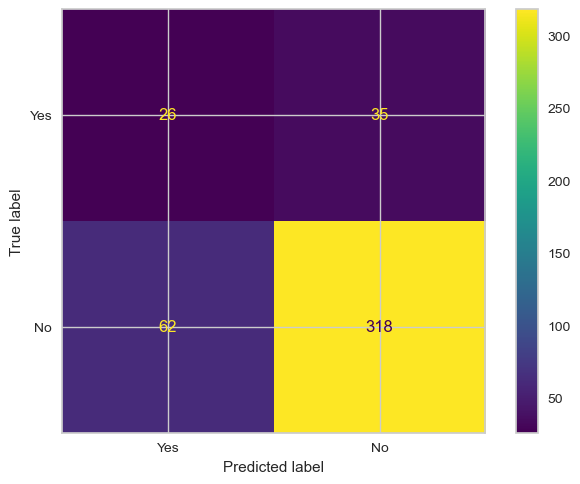

In [180]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classesMapped)
disp.plot()
plt.show()

In [181]:
# Create an initialise SVM classifier
svm_classifier = SVC(C=3, kernel='rbf', gamma=0.1)

# Calculate the score using cross validation method
scores = cross_val_score(svm_classifier, X_train, y_train, cv=10, scoring='accuracy')

print('CV Mean: {:.4f}'.format(np.mean(scores)))
print('STD: {:.4f}'.format(np.std(scores)))

CV Mean: 0.8455
STD: 0.0134


### 80/20 Training/Test Split

In [191]:
# 80% training and 20% test.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [192]:
# Display the rows and columns (dimensions) of an unsplitted dataset
print('Total number of rows and columns for the complete dataset: ', X.shape, y.shape)

# Display the rows and columns (dimensions) of the splitted dataset
print('Number of rows and columns after splitting dataset: ', X_train.shape, X_test.shape, y_train.shape, y_test.shape)

Total number of rows and columns for the complete dataset:  (1470, 22) (1470,)
Number of rows and columns after splitting dataset:  (1176, 22) (294, 22) (1176,) (294,)


### Scaling 80/20 data

In [193]:
# select the continuous numerical variables
cont_num_var = ['Age','DistanceFromHome', 'EnvironmentSatisfaction','JobInvolvement', 'JobLevel',
                'JobSatisfaction', 'MonthlyIncome', 'PercentSalaryHike', 'PerformanceRating',
                'RelationshipSatisfaction', 'TotalWorkingYears', 'WorkLifeBalance',
                'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
                'YearsWithCurrManager']

# Instantiate the MinMaxScaler 
scaler = MinMaxScaler()

# Normalize the continuous numerical variables
X_train[cont_num_var] = scaler.fit_transform(X_train[cont_num_var])

X_test[cont_num_var] = scaler.transform(X_test[cont_num_var])

### 80/20 SMOTE

In [194]:
# Apply SMOTE on the training set
smt = SMOTE(random_state = 42)
X_train_res, y_train_res = smt.fit_resample(X_train, y_train)

In [196]:
print(attrition_dict)
print('\nClass distribution before SMOTE: \n', pd.Series(y_train).value_counts())
print('\nClass distribution after SMOTE: \n', pd.Series(y_train_res).value_counts())

{2: 'No', 1: 'Yes'}

Class distribution before SMOTE: 
 2    978
1    198
Name: Attrition, dtype: int64

Class distribution after SMOTE: 
 2    978
1    978
Name: Attrition, dtype: int64


### Model Building

In [197]:
# Support Vector Machines(SVM)
clf = svm.SVC(C=3, kernel='rbf', gamma=0.1)

# Printing all the parameters of SVM
print(clf)

SVC(C=3, gamma=0.1)


In [198]:
# Creating the model on resampled Training Data
SVM = clf.fit(X_train_res, y_train_res)
prediction = SVM.predict(X_test)

# Measuring accuracy on Testing Data
print(metrics.classification_report(y_test, prediction))

              precision    recall  f1-score   support

           1       0.31      0.44      0.37        39
           2       0.91      0.85      0.88       255

    accuracy                           0.80       294
   macro avg       0.61      0.65      0.62       294
weighted avg       0.83      0.80      0.81       294



In [199]:
print('Score SVM test 20% : {:.4f}'.format(SVM.score(X_test,y_test)))

Score SVM test 20% : 0.7993


### Confusion Matrix

In [200]:
cm = metrics.confusion_matrix(y_test, prediction)
print(cm)

[[ 17  22]
 [ 37 218]]


In [203]:
(17+218)/(17+218+37+22)

0.7993197278911565

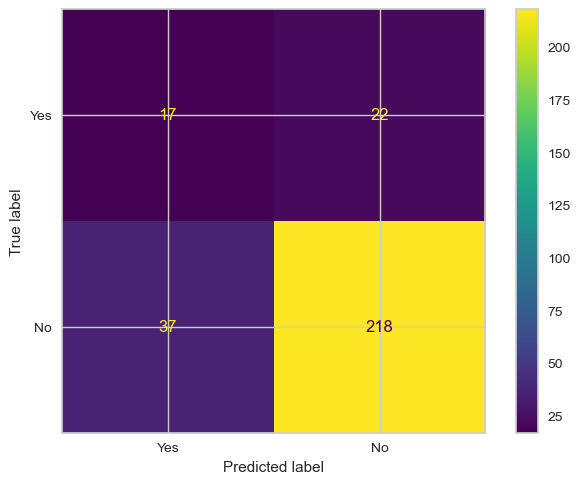

In [123]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classesMapped)
disp.plot()
plt.show()

In [124]:
# Create an initialise SVM classifier
svm_classifier = SVC(C=3, kernel='rbf', gamma=0.1)

# Calculate the score using cross validation method
scores = cross_val_score(svm_classifier, X_train, y_train, cv=10, scoring='accuracy')

print('CV Mean: {:.4f}'.format(np.mean(scores)))
print('STD: {:.4f}'.format(np.std(scores)))

CV Mean: 0.8478
STD: 0.0129


### 90/10 Training/Test Split

In [208]:
# 90% training and 10% test.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

In [209]:
# Display the rows and columns (dimensions) of an unsplitted dataset
print('Total number of rows and columns for the complete dataset: ', X.shape, y.shape)

# Display the rows and columns (dimensions) of the splitted dataset
print('Number of rows and columns after splitting dataset: ', X_train.shape, X_test.shape, y_train.shape, y_test.shape)

Total number of rows and columns for the complete dataset:  (1470, 22) (1470,)
Number of rows and columns after splitting dataset:  (1323, 22) (147, 22) (1323,) (147,)


### Scaling 90/10 data

In [210]:
# select the continuous numerical variables
cont_num_var = ['Age','DistanceFromHome', 'EnvironmentSatisfaction','JobInvolvement', 'JobLevel',
                'JobSatisfaction', 'MonthlyIncome', 'PercentSalaryHike', 'PerformanceRating',
                'RelationshipSatisfaction', 'TotalWorkingYears', 'WorkLifeBalance',
                'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
                'YearsWithCurrManager']

# Instantiate the MinMaxScaler 
scaler = MinMaxScaler()

# Normalize the continuous numerical variables
X_train[cont_num_var] = scaler.fit_transform(X_train[cont_num_var])

X_test[cont_num_var] = scaler.transform(X_test[cont_num_var])

### 90/10 SMOTE

In [211]:
# Apply SMOTE on the training set
smt = SMOTE(random_state = 42)
X_train_res, y_train_res = smt.fit_resample(X_train, y_train)

In [213]:
print(attrition_dict)
print('\nClass distribution before SMOTE: \n', pd.Series(y_train).value_counts())
print('\nClass distribution after SMOTE: \n', pd.Series(y_train_res).value_counts())

{2: 'No', 1: 'Yes'}

Class distribution before SMOTE: 
 2    1109
1     214
Name: Attrition, dtype: int64

Class distribution after SMOTE: 
 1    1109
2    1109
Name: Attrition, dtype: int64


### Model Building

In [214]:
# Support Vector Machines(SVM)
clf = svm.SVC(C=3, kernel='rbf', gamma=0.1)

# Printing all the parameters of SVM
print(clf)

SVC(C=3, gamma=0.1)


In [215]:
# Creating the model on resampled Training Data
SVM = clf.fit(X_train_res, y_train_res)
prediction = SVM.predict(X_test)

# Measuring accuracy on Testing Data
print(metrics.classification_report(y_test, prediction))

              precision    recall  f1-score   support

           1       0.37      0.48      0.42        23
           2       0.90      0.85      0.87       124

    accuracy                           0.79       147
   macro avg       0.63      0.66      0.64       147
weighted avg       0.81      0.79      0.80       147



In [216]:
print('Score SVM test 10% : {:.4f}'.format(SVM.score(X_test,y_test)))

Score SVM test 10% : 0.7891


### Confusion Matrix

In [217]:
cm = metrics.confusion_matrix(y_test, prediction)
print(cm)

[[ 11  12]
 [ 19 105]]


In [218]:
(11+105)/(11+105+19+12)

0.7891156462585034

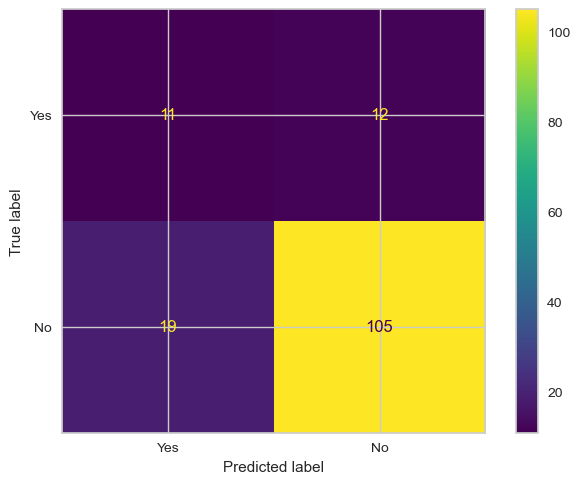

In [136]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classesMapped)
disp.plot()
plt.show()

In [76]:
# Create an initialise SVM classifier
svm_classifier = SVC(kernel='linear')

# Calculate the score using cross validation method
scores = cross_val_score(svm_classifier, X_train, y_train, cv=10, scoring='accuracy')

print('CV Mean: {:.4f}'.format(np.mean(scores)))
print('STD: {:.4f}'.format(np.std(scores)))

CV Mean: 0.8428
STD: 0.0149


## Machine Learning modelling outcomes SVM

In [127]:
data = {'Split': ['30%', '20%', '10%'],
    'Accuracy Score': [0.7800, 0.7993, 0.7891],
    'K-Fold CV': [0.8455, 0.8478, 0.8428]}
    
df_svm = pd.DataFrame(data)
print(df_svm)

  Split  Accuracy Score  K-Fold CV
0   30%            0.78       0.85
1   20%            0.80       0.85
2   10%            0.79       0.84


In [153]:
data = [{'Split': '30%', 'TP': 26, 'TN': 318, 'FN Type II Error': 62, 'FP Type I Error': 35,},
    {'Split': '20%', 'TP': 17, 'TN': 218, 'FN Type II Error': 37, 'FP Type I Error': 22},
    {'Split': '10%', 'TP': 11, 'TN': 105, 'FN Type II Error': 19, 'FP Type I Error': 12}]

cf_svm = pd.DataFrame(data)
print('Confusion Matrix SVM\n\n',cf_svm)

Confusion Matrix SVM

   Split  TP   TN  FN Type II Error  FP Type I Error
0   30%  26  318                62               35
1   20%  17  218                37               22
2   10%  11  105                19               12


# Hyperparameter Tuning 

Now, we have multiple hyperparameters to optimise - 
- The choice of kernel (linear, rbf etc.)
- C
- gamma

I'll use the ```GridSearchCV()``` method to tune the hyperparameters. 

## Grid Search to Find Optimal Hyperparameters (KERNEL='RBF')

Let's first use the RBF kernel to find the optimal C and gamma (we can consider the kernel as a hyperparameter as well, though training the model will take an exorbitant amount of time).

In [142]:
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

# creating a KFold object with 5 splits 
folds = KFold(n_splits = 5, shuffle = True, random_state = 4)

# specify range of hyperparameters
# Set the parameters by cross-validation
hyper_params = [ {'gamma': [0.01, 0.001, 0.0001],
                     'C': [1, 10, 100, 1000]}]


# specify model
model = SVC(kernel="rbf")

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = model, 
                        param_grid = hyper_params, 
                        scoring= 'accuracy', 
                        cv = folds, 
                        verbose = 2,
                        return_train_score=True)      

# fit the model 
model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] END ....................................C=1, gamma=0.01; total time=   0.0s
[CV] END ....................................C=1, gamma=0.01; total time=   0.0s
[CV] END ....................................C=1, gamma=0.01; total time=   0.0s
[CV] END ....................................C=1, gamma=0.01; total time=   0.0s
[CV] END ....................................C=1, gamma=0.01; total time=   0.0s
[CV] END ...................................C=1, gamma=0.001; total time=   0.0s
[CV] END ...................................C=1, gamma=0.001; total time=   0.0s
[CV] END ...................................C=1, gamma=0.001; total time=   0.0s
[CV] END ...................................C=1, gamma=0.001; total time=   0.0s
[CV] END ...................................C=1, gamma=0.001; total time=   0.0s
[CV] END ..................................C=1, gamma=0.0001; total time=   0.0s
[CV] END ..................................C=1, 

GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             estimator=SVC(),
             param_grid=[{'C': [1, 10, 100, 1000],
                          'gamma': [0.01, 0.001, 0.0001]}],
             return_train_score=True, scoring='accuracy', verbose=2)

In [143]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.04,0.01,0.01,0.00,1,0.01,"{'C': 1, 'gamma': 0.01}",0.81,0.84,0.86,...,0.84,0.02,6,0.84,0.84,0.83,0.83,0.84,0.84,0.00
1,0.03,0.00,0.01,0.00,1,0.00,"{'C': 1, 'gamma': 0.001}",0.81,0.84,0.86,...,0.84,0.02,6,0.84,0.84,0.83,0.83,0.84,0.84,0.00
2,0.03,0.00,0.02,0.00,1,0.00,"{'C': 1, 'gamma': 0.0001}",0.81,0.84,0.86,...,0.84,0.02,6,0.84,0.84,0.83,0.83,0.84,0.84,0.00
3,0.04,0.00,0.02,0.00,10,0.01,"{'C': 10, 'gamma': 0.01}",0.81,0.84,0.87,...,0.84,0.02,4,0.85,0.84,0.87,0.85,0.84,0.85,0.01
4,0.04,0.00,0.02,0.00,10,0.00,"{'C': 10, 'gamma': 0.001}",0.81,0.84,0.86,...,0.84,0.02,6,0.84,0.84,0.83,0.83,0.84,0.84,0.00
5,0.04,0.00,0.02,0.00,10,0.00,"{'C': 10, 'gamma': 0.0001}",0.81,0.84,0.86,...,0.84,0.02,6,0.84,0.84,0.83,0.83,0.84,0.84,0.00
6,0.05,0.01,0.02,0.00,100,0.01,"{'C': 100, 'gamma': 0.01}",0.83,0.87,0.86,...,0.86,0.01,1,0.89,0.88,0.89,0.89,0.89,0.89,0.00
7,0.04,0.01,0.01,0.00,100,0.00,"{'C': 100, 'gamma': 0.001}",0.81,0.84,0.87,...,0.84,0.02,5,0.84,0.84,0.86,0.83,0.84,0.84,0.01
8,0.05,0.00,0.02,0.00,100,0.00,"{'C': 100, 'gamma': 0.0001}",0.81,0.84,0.86,...,0.84,0.02,6,0.84,0.84,0.83,0.83,0.84,0.84,0.00
9,0.15,0.02,0.02,0.00,1000,0.01,"{'C': 1000, 'gamma': 0.01}",0.81,0.86,0.85,...,0.85,0.02,3,0.92,0.92,0.92,0.92,0.92,0.92,0.00


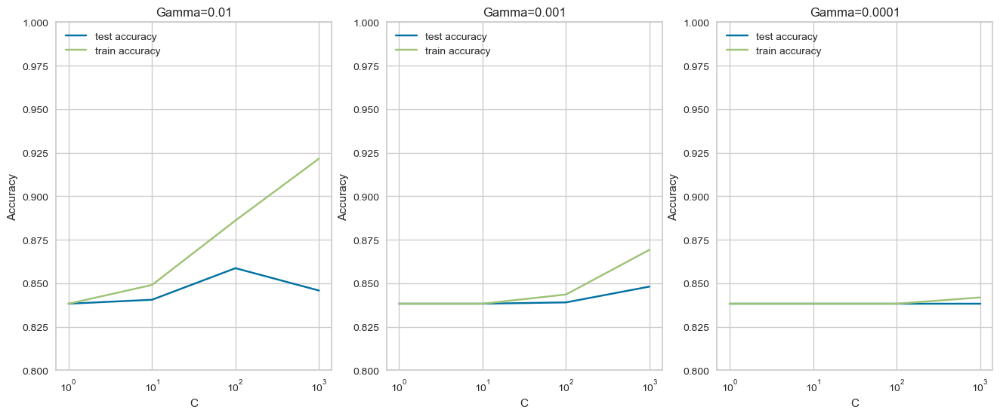

In [144]:
# converting C to numeric type for plotting on x-axis
cv_results['param_C'] = cv_results['param_C'].astype('int')

# # plotting
plt.figure(figsize=(16,6))

# subplot 1/3
plt.subplot(131)
gamma_01 = cv_results[cv_results['param_gamma']==0.01]

plt.plot(gamma_01["param_C"], gamma_01["mean_test_score"])
plt.plot(gamma_01["param_C"], gamma_01["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("Gamma=0.01")
plt.ylim([0.80, 1])
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')

# subplot 2/3
plt.subplot(132)
gamma_001 = cv_results[cv_results['param_gamma']==0.001]

plt.plot(gamma_001["param_C"], gamma_001["mean_test_score"])
plt.plot(gamma_001["param_C"], gamma_001["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("Gamma=0.001")
plt.ylim([0.80, 1])
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')

# subplot 3/3
plt.subplot(133)
gamma_0001 = cv_results[cv_results['param_gamma']==0.0001]

plt.plot(gamma_0001["param_C"], gamma_0001["mean_test_score"])
plt.plot(gamma_0001["param_C"], gamma_0001["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("Gamma=0.0001")
plt.ylim([0.80, 1])
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')

In [145]:
# printing the optimal accuracy score and hyperparameters
best_score = model_cv.best_score_
best_hyperparams = model_cv.best_params_

print("The best test score is {0:.4f} corresponding to hyperparameters {1}".format(best_score, best_hyperparams))

The best test score is 0.8587 corresponding to hyperparameters {'C': 100, 'gamma': 0.01}


### Building and Evaluating the Final Model

Let's now build and evaluate the final model, i.e. the model with highest test accuracy.

In [146]:
# specify optimal hyperparameters
best_params = {"C": 100, "gamma": 0.0001, "kernel":"rbf"}

# model
model = SVC(C=100, gamma=0.0001, kernel="rbf")

model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# metrics
print(metrics.confusion_matrix(y_test, y_pred), "\n")
print('Accuracy {:.4f}'.format(metrics.accuracy_score(y_test, y_pred)))
print('Precision {:.4}'.format(metrics.precision_score(y_test, y_pred)))
print('Sensitivity/Recall {:.4}'.format(metrics.recall_score(y_test, y_pred)))

[[  0  23]
 [  0 124]] 

Accuracy 0.8435
Precision 0.0
Sensitivity/Recall 0.0


## Grid Search to Find Optimal Hyperparameters (KERNEL='LINEAR')

Let's first use the LINEAL kernel to find the optimal C and gamma (we can consider the kernel as a hyperparameter as well, though training the model will take an exorbitant amount of time).

In [174]:
# creating a KFold object with 5 splits 
folds = KFold(n_splits = 5, shuffle = True, random_state = 4)

# specify range of hyperparameters
# Set the parameters by cross-validation
hyper_params = [ {'gamma': [0.01, 0.001, 0.0001],
                     'C': [1, 10, 100, 1000]}]


# specify model
model = SVC(kernel="linear")

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = model, 
                        param_grid = hyper_params, 
                        scoring= 'accuracy', 
                        cv = folds, 
                        verbose = 2,
                        return_train_score=True)      

# fit the model
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] END ....................................C=1, gamma=0.01; total time=   0.0s
[CV] END ....................................C=1, gamma=0.01; total time=   0.0s
[CV] END ....................................C=1, gamma=0.01; total time=   0.0s
[CV] END ....................................C=1, gamma=0.01; total time=   0.0s
[CV] END ....................................C=1, gamma=0.01; total time=   0.0s
[CV] END ...................................C=1, gamma=0.001; total time=   0.0s
[CV] END ...................................C=1, gamma=0.001; total time=   0.0s
[CV] END ...................................C=1, gamma=0.001; total time=   0.0s
[CV] END ...................................C=1, gamma=0.001; total time=   0.0s
[CV] END ...................................C=1, gamma=0.001; total time=   0.0s
[CV] END ..................................C=1, gamma=0.0001; total time=   0.0s
[CV] END ..................................C=1, 

GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             estimator=SVC(kernel='linear'),
             param_grid=[{'C': [1, 10, 100, 1000],
                          'gamma': [0.01, 0.001, 0.0001]}],
             return_train_score=True, scoring='accuracy', verbose=2)

In [175]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.02,0.00,0.00,0.00,1,0.01,"{'C': 1, 'gamma': 0.01}",0.81,0.84,0.86,...,0.84,0.02,7,0.84,0.84,0.87,0.87,0.84,0.85,0.01
1,0.02,0.00,0.00,0.00,1,0.00,"{'C': 1, 'gamma': 0.001}",0.81,0.84,0.86,...,0.84,0.02,7,0.84,0.84,0.87,0.87,0.84,0.85,0.01
2,0.02,0.00,0.00,0.00,1,0.00,"{'C': 1, 'gamma': 0.0001}",0.81,0.84,0.86,...,0.84,0.02,7,0.84,0.84,0.87,0.87,0.84,0.85,0.01
3,0.04,0.02,0.00,0.00,10,0.01,"{'C': 10, 'gamma': 0.01}",0.81,0.84,0.86,...,0.84,0.02,1,0.84,0.84,0.86,0.87,0.84,0.85,0.01
4,0.04,0.02,0.00,0.00,10,0.00,"{'C': 10, 'gamma': 0.001}",0.81,0.84,0.86,...,0.84,0.02,1,0.84,0.84,0.86,0.87,0.84,0.85,0.01
5,0.05,0.02,0.00,0.00,10,0.00,"{'C': 10, 'gamma': 0.0001}",0.81,0.84,0.86,...,0.84,0.02,1,0.84,0.84,0.86,0.87,0.84,0.85,0.01
6,1.83,1.30,0.00,0.00,100,0.01,"{'C': 100, 'gamma': 0.01}",0.81,0.84,0.86,...,0.84,0.02,7,0.84,0.84,0.87,0.87,0.84,0.85,0.01
7,1.86,1.32,0.00,0.00,100,0.00,"{'C': 100, 'gamma': 0.001}",0.81,0.84,0.86,...,0.84,0.02,7,0.84,0.84,0.87,0.87,0.84,0.85,0.01
8,1.82,1.27,0.00,0.00,100,0.00,"{'C': 100, 'gamma': 0.0001}",0.81,0.84,0.86,...,0.84,0.02,7,0.84,0.84,0.87,0.87,0.84,0.85,0.01
9,8.43,4.24,0.00,0.00,1000,0.01,"{'C': 1000, 'gamma': 0.01}",0.81,0.84,0.86,...,0.84,0.02,1,0.84,0.84,0.87,0.87,0.84,0.85,0.01


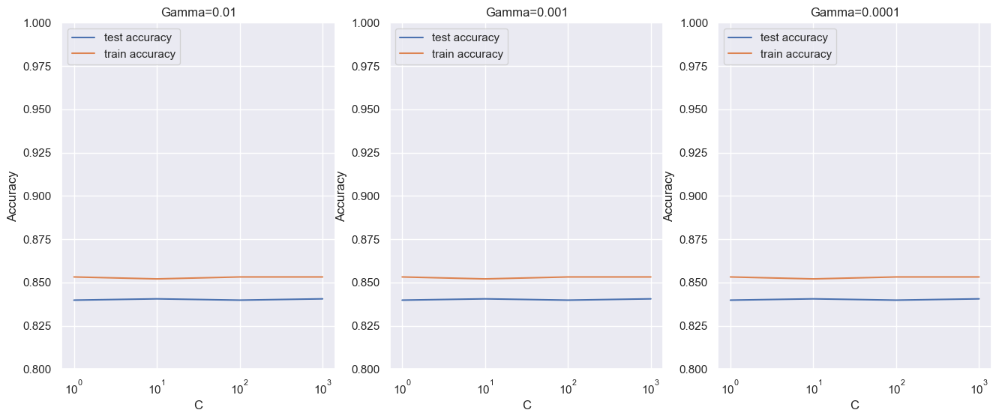

In [176]:
# converting C to numeric type for plotting on x-axis
cv_results['param_C'] = cv_results['param_C'].astype('int')

# # plotting
plt.figure(figsize=(16,6))

# subplot 1/3
plt.subplot(131)
gamma_01 = cv_results[cv_results['param_gamma']==0.01]

plt.plot(gamma_01["param_C"], gamma_01["mean_test_score"])
plt.plot(gamma_01["param_C"], gamma_01["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("Gamma=0.01")
plt.ylim([0.80, 1])
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')

# subplot 2/3
plt.subplot(132)
gamma_001 = cv_results[cv_results['param_gamma']==0.001]

plt.plot(gamma_001["param_C"], gamma_001["mean_test_score"])
plt.plot(gamma_001["param_C"], gamma_001["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("Gamma=0.001")
plt.ylim([0.80, 1])
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')

# subplot 3/3
plt.subplot(133)
gamma_0001 = cv_results[cv_results['param_gamma']==0.0001]

plt.plot(gamma_0001["param_C"], gamma_0001["mean_test_score"])
plt.plot(gamma_0001["param_C"], gamma_0001["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("Gamma=0.0001")
plt.ylim([0.80, 1])
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')

In [177]:
# printing the optimal accuracy score and hyperparameters
best_score = model_cv.best_score_
best_hyperparams = model_cv.best_params_

print('The best test score is {0:.4f} corresponding to hyperparameters {1}'.format(best_score, best_hyperparams))

The best test score is 0.8405 corresponding to hyperparameters {'C': 10, 'gamma': 0.01}


### Building and Evaluating the Final Model

Let's now build and evaluate the final model, i.e. the model with highest test accuracy.

In [196]:
# specify optimal hyperparameters
best_params = {"C": 100, "gamma": 0.0001, "kernel":"linear"}

# model
model = SVC(C=100, gamma=0.0001, kernel="linear")

model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# metrics
print(metrics.confusion_matrix(y_test, y_pred), "\n")
print('Accuracy {:.4f}'.format(metrics.accuracy_score(y_test, y_pred)))
print('Precision {:.4}'.format(metrics.precision_score(y_test, y_pred)))
print('Sensitivity/Recall {:.4}'.format(metrics.recall_score(y_test, y_pred)))

[[  8  53]
 [  2 378]] 

Accuracy 0.8753
Precision 0.8
Sensitivity/Recall 0.1311


# Random Forest

### 70/30 Training/Test Split

In [70]:
# 70% training and 30% test.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [71]:
# Display the rows and columns (dimensions) of an unsplitted dataset
print('Total number of rows and columns for the complete dataset: ', X.shape, y.shape)

# Display the rows and columns (dimensions) of the splitted dataset
print('Number of rows and columns after splitting dataset: ', X_train.shape, X_test.shape, y_train.shape, y_test.shape)

Total number of rows and columns for the complete dataset:  (1470, 22) (1470,)
Number of rows and columns after splitting dataset:  (1029, 22) (441, 22) (1029,) (441,)


### Scaling 70/30 data

In [72]:
# select the continuous numerical variables
cont_num_var = ['Age','DistanceFromHome', 'EnvironmentSatisfaction','JobInvolvement', 'JobLevel',
                'JobSatisfaction', 'MonthlyIncome', 'PercentSalaryHike', 'PerformanceRating',
                'RelationshipSatisfaction', 'TotalWorkingYears', 'WorkLifeBalance',
                'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
                'YearsWithCurrManager']

# Instantiate the MinMaxScaler 
scaler = MinMaxScaler()

# Normalize the continuous numerical variables
X_train[cont_num_var] = scaler.fit_transform(X_train[cont_num_var])

X_test[cont_num_var] = scaler.transform(X_test[cont_num_var])

In [73]:
print(X_train.head())
print(X_train.describe())

      Age  Department  DistanceFromHome  EducationField  \
714  0.76           2              0.00               3   
135  0.43           2              0.18               3   
1271 0.07           1              0.21               4   
477  0.76           3              0.07               3   
806  0.81           2              0.21               1   

      EnvironmentSatisfaction  Gender  JobInvolvement  JobLevel  JobRole  \
714                      1.00       2            0.67      0.75        8   
135                      0.33       2            0.67      0.25        4   
1271                     0.33       2            0.67      0.00        7   
477                      0.00       2            0.67      1.00        6   
806                      0.33       2            0.67      0.50        5   

      JobSatisfaction  ...  OverTime  PercentSalaryHike  PerformanceRating  \
714              1.00  ...         2               0.79               1.00   
135              0.33  ...      

In [74]:
print(X_test.head())
print(X_test.describe())

      Age  Department  DistanceFromHome  EducationField  \
1041 0.24           1              0.14               3   
184  0.83           2              0.43               3   
1222 0.14           3              0.75               6   
67   0.64           2              0.21               1   
220  0.43           2              0.14               1   

      EnvironmentSatisfaction  Gender  JobInvolvement  JobLevel  JobRole  \
1041                     1.00       2            0.67      0.25        1   
184                      1.00       1            1.00      0.25        4   
1222                     1.00       2            0.00      0.00        9   
67                       0.33       2            0.67      0.50        2   
220                      1.00       2            0.67      0.25        3   

      JobSatisfaction  ...  OverTime  PercentSalaryHike  PerformanceRating  \
1041             0.00  ...         2               0.50               0.00   
184              0.00  ...      

### 70/30 SMOTE

In [75]:
smt = SMOTE(random_state = 42)
X_train_res, y_train_res = smt.fit_resample(X_train, y_train)

In [77]:
print(attrition_dict)
print('\nClass distribution before SMOTE: \n', pd.Series(y_train).value_counts())
print('\nClass distribution after SMOTE: \n', pd.Series(y_train_res).value_counts())

{2: 'No', 1: 'Yes'}

Class distribution before SMOTE: 
 2    853
1    176
Name: Attrition, dtype: int64

Class distribution after SMOTE: 
 2    853
1    853
Name: Attrition, dtype: int64


### Model Building

In [80]:
# Random Forest (Bagging of multiple Decision Trees)
clf = RandomForestClassifier(max_depth=2, n_estimators=100,criterion='gini')

# Printing all the parameters of Random Forest
print(clf)

RandomForestClassifier(max_depth=2)


In [81]:
# Creating the model on resampled Training Data
RF=clf.fit(X_train_res, y_train_res)
y_pred = RF.predict(X_test)

In [82]:
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.34      0.49      0.40        61
           2       0.91      0.84      0.88       380

    accuracy                           0.80       441
   macro avg       0.62      0.67      0.64       441
weighted avg       0.83      0.80      0.81       441



In [85]:
print('Score RF test 30% : {:.4f}'.format(RF.score(X_test,y_test)))

Score RF test 30% : 0.7959


### Confusion Matrix

In [86]:
cm = metrics.confusion_matrix(y_test, y_pred)
print(cm)

[[ 30  31]
 [ 59 321]]


In [88]:
(30+321)/(30+321+59+31)

0.7959183673469388

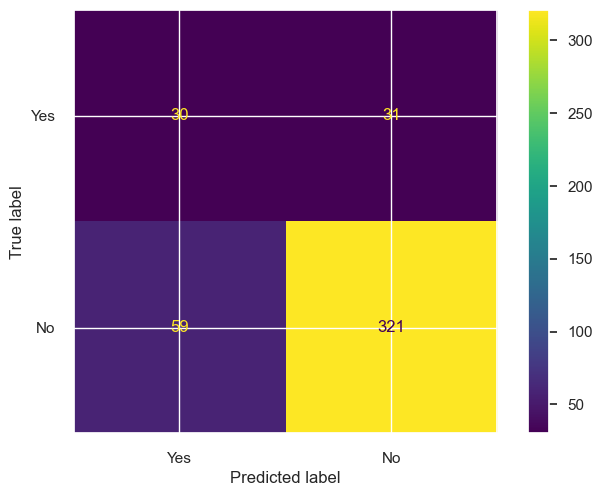

In [92]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classesMapped)

disp.plot()
plt.show()

In [93]:
# Create and initialise random forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, max_depth=10)

# Calculate the score using cross validation method
scores = cross_val_score(rf_classifier, X_train, y_train, cv=10, scoring='accuracy')

print('CV Mean: {:.4f}'.format(np.mean(scores)))
print('STD: {:.4f}'.format(np.std(scores)))

CV Mean: 0.8571
STD: 0.0189


### 80/20 Training/Test Split

In [93]:
# 80% training and 20% test.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [94]:
# Display the rows and columns (dimensions) of an unsplitted dataset
print('Total number of rows and columns for the complete dataset: ', X.shape, y.shape)

# Display the rows and columns (dimensions) of the splitted dataset
print('Number of rows and columns after splitting dataset: ', X_train.shape, X_test.shape, y_train.shape, y_test.shape)

Total number of rows and columns for the complete dataset:  (1470, 22) (1470,)
Number of rows and columns after splitting dataset:  (1176, 22) (294, 22) (1176,) (294,)


### Scaling 80/20 data

In [95]:
# select the continuous numerical variables
cont_num_var = ['Age','DistanceFromHome', 'EnvironmentSatisfaction','JobInvolvement', 'JobLevel',
                'JobSatisfaction', 'MonthlyIncome', 'PercentSalaryHike', 'PerformanceRating',
                'RelationshipSatisfaction', 'TotalWorkingYears', 'WorkLifeBalance',
                'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
                'YearsWithCurrManager']

# Instantiate the MinMaxScaler 
scaler = MinMaxScaler()

# Normalize the continuous numerical variables
X_train[cont_num_var] = scaler.fit_transform(X_train[cont_num_var])

X_test[cont_num_var] = scaler.transform(X_test[cont_num_var])

### 80/20 SMOTE

In [96]:
# Apply SMOTE on the training set
smt = SMOTE(random_state = 42)
X_train_res, y_train_res = smt.fit_resample(X_train, y_train)

In [100]:
print(attrition_dict)
print('\nClass distribution before SMOTE: \n', pd.Series(y_train).value_counts())
print('\nClass distribution after SMOTE: \n', pd.Series(y_train_res).value_counts())

{2: 'No', 1: 'Yes'}

Class distribution before SMOTE: 
 2    978
1    198
Name: Attrition, dtype: int64

Class distribution after SMOTE: 
 2    978
1    978
Name: Attrition, dtype: int64


### Model Building

In [97]:
# Random Forest (Bagging of multiple Decision Trees)
clf = RandomForestClassifier(max_depth=2, n_estimators=100,criterion='gini')

# Printing all the parameters of Random Forest
print(clf)

RandomForestClassifier(max_depth=2)


In [98]:
# Creating the model on resampled Training Data
RF=clf.fit(X_train_res, y_train_res)
y_pred = RF.predict(X_test)

In [99]:
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.33      0.49      0.40        39
           2       0.92      0.85      0.88       255

    accuracy                           0.80       294
   macro avg       0.62      0.67      0.64       294
weighted avg       0.84      0.80      0.82       294



In [100]:
print('Score RF test 20% : {:.4f}'.format(RF.score(X_test,y_test)))

Score RF test 20% : 0.8027


### Confusion Matrix

In [101]:
cm = metrics.confusion_matrix(y_test, y_pred)
print(cm)

[[ 19  20]
 [ 38 217]]


In [104]:
(19+217)/(19+217+38+20)

0.8027210884353742

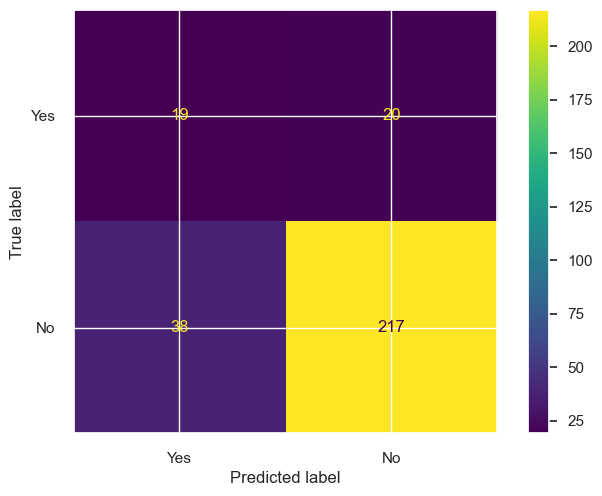

In [105]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classesMapped)

disp.plot()
plt.show()

In [108]:
# Create and initialise random forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, max_depth=10)

# Calculate the score using cross validation method
scores = cross_val_score(rf_classifier, X_train, y_train, cv=10, scoring='accuracy')

print('CV Mean: {:.4f}'.format(np.mean(scores)))
print('STD: {:.4f}'.format(np.std(scores)))

CV Mean: 0.8537
STD: 0.0198


### 90/10 Training/Test Split

In [106]:
# 90% training and 10% test.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=42)

In [107]:
# Display the rows and columns (dimensions) of an unsplitted dataset
print('Total number of rows and columns for the complete dataset: ', X.shape, y.shape)

# Display the rows and columns (dimensions) of the splitted dataset
print('Number of rows and columns after splitting dataset: ', X_train.shape, X_test.shape, y_train.shape, y_test.shape)

Total number of rows and columns for the complete dataset:  (1470, 22) (1470,)
Number of rows and columns after splitting dataset:  (1323, 22) (147, 22) (1323,) (147,)


### Scaling 90/10 data

In [108]:
# select the continuous numerical variables
cont_num_var = ['Age','DistanceFromHome', 'EnvironmentSatisfaction','JobInvolvement', 'JobLevel',
                'JobSatisfaction', 'MonthlyIncome', 'PercentSalaryHike', 'PerformanceRating',
                'RelationshipSatisfaction', 'TotalWorkingYears', 'WorkLifeBalance',
                'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
                'YearsWithCurrManager']

# Instantiate the MinMaxScaler 
scaler = MinMaxScaler()

# Normalize the continuous numerical variables
X_train[cont_num_var] = scaler.fit_transform(X_train[cont_num_var])

X_test[cont_num_var] = scaler.transform(X_test[cont_num_var])

### 90/10 SMOTE

In [109]:
# Apply SMOTE on the training set
smt = SMOTE(random_state = 42)
X_train_res, y_train_res = smt.fit_resample(X_train, y_train)

In [115]:
print(attrition_dict)
print('\nClass distribution before SMOTE: \n', pd.Series(y_train).value_counts())
print('\nClass distribution after SMOTE: \n', pd.Series(y_train_res).value_counts())

{2: 'No', 1: 'Yes'}

Class distribution before SMOTE: 
 2    1109
1     214
Name: Attrition, dtype: int64

Class distribution after SMOTE: 
 1    1109
2    1109
Name: Attrition, dtype: int64


### Model Building

In [110]:
# Random Forest (Bagging of multiple Decision Trees)
clf = RandomForestClassifier(max_depth=2, n_estimators=100,criterion='gini')

# Printing all the parameters of Random Forest
print(clf)

RandomForestClassifier(max_depth=2)


In [112]:
# Creating the model on resampled Training Data
RF=clf.fit(X_train_res, y_train_res)
y_pred = RF.predict(X_test)

In [113]:
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.35      0.48      0.41        23
           2       0.90      0.84      0.87       124

    accuracy                           0.78       147
   macro avg       0.63      0.66      0.64       147
weighted avg       0.81      0.78      0.79       147



In [116]:
print('Score RF test 10% : {:.4f}'.format(RF.score(X_test,y_test)))

Score RF test 10% : 0.7823


### Confusion Matrix

In [117]:
cm = metrics.confusion_matrix(y_test, y_pred)
print(cm)

[[ 11  12]
 [ 20 104]]


In [148]:
(11+104)/(11+104+20+12)

0.782312925170068

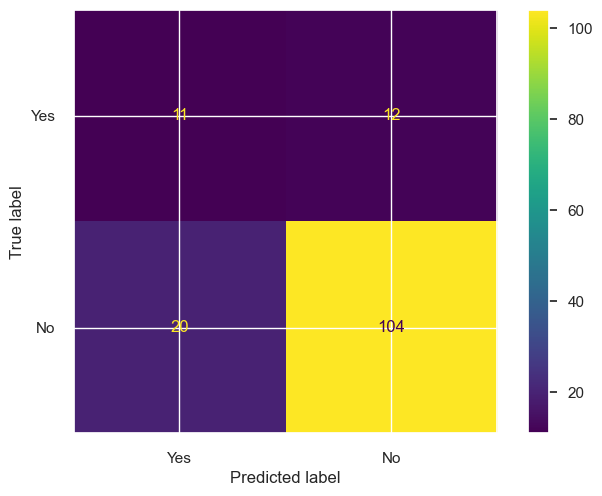

In [120]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classesMapped)

disp.plot()
plt.show()

In [123]:
# Create and initialise random forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, max_depth=10)

# Calculate the score using cross validation method
scores = cross_val_score(rf_classifier, X_train, y_train, cv=10, scoring='accuracy')

print('CV Mean: {:.4f}'.format(np.mean(scores)))
print('STD: {:.4f}'.format(np.std(scores)))

CV Mean: 0.8557
STD: 0.0205


## Machine Learning modelling outcomes RF

In [121]:
data = {'Split': ['30%', '20%', '10%'],
    'Accuracy Score': [0.7959,0.8027,0.7823],
    'K-Fold CV' : [0.8571, 0.8537, 0.8557]}
    
df_rf = pd.DataFrame(data)
print(df_rf)

  Split  Accuracy Score  K-Fold CV
0   30%            0.80       0.86
1   20%            0.80       0.85
2   10%            0.78       0.86


In [154]:
data = [{'Split': '30%', 'TP': 30, 'TN': 321, 'FN Type II Error': 59, 'FP Type I Error': 31,},
    {'Split': '20%', 'TP': 19, 'TN': 217, 'FN Type II Error': 38, 'FP Type I Error': 20},
    {'Split': '10%', 'TP': 11, 'TN': 104, 'FN Type II Error': 20, 'FP Type I Error': 12}]

cf_rf = pd.DataFrame(data)
print('Confusion Matrix RF\n\n',cf_rf)

Confusion Matrix RF

   Split  TP   TN  FN Type II Error  FP Type I Error
0   30%  30  321                59               31
1   20%  19  217                38               20
2   10%  11  104                20               12


## Feature Importances

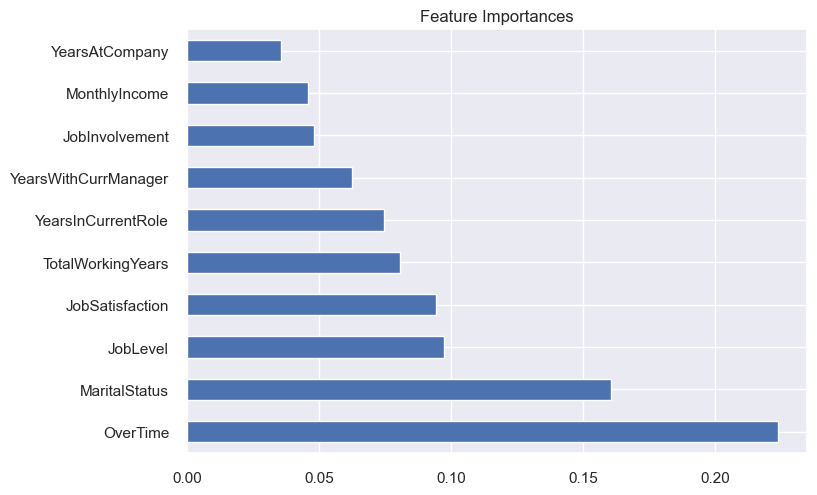

In [122]:
# Plotting the feature importance for Top 10 most important columns
feature_importances = pd.Series(RF.feature_importances_, index=X.columns)
feature_importances.nlargest(10).plot(kind='barh', title = 'Feature Importances', grid=True);

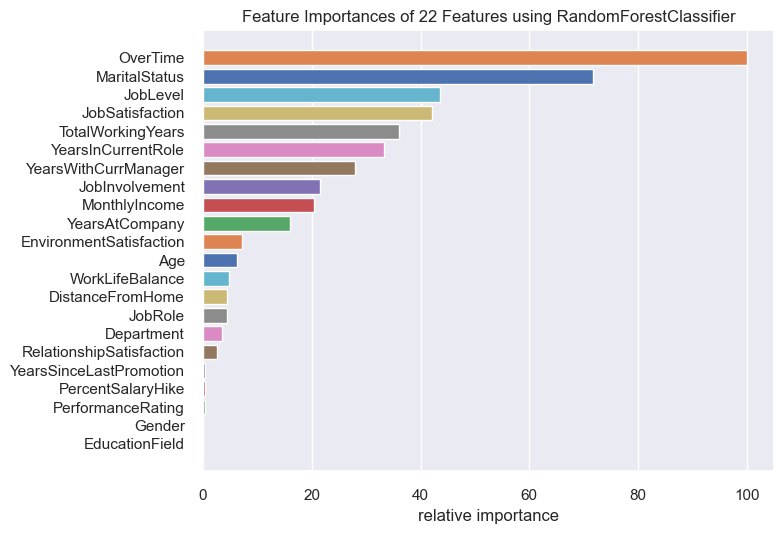

In [125]:
viz = FeatureImportances(clf, labels=X.columns)
viz.fit(X_train, y_train)
viz.show();

## Hyperparameter Tuning
 Tuning max_depth

In [288]:
# GridSearchCV to find optimal n_estimators
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 20, 5)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy")
rf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': range(2, 20, 5)}, scoring='accuracy')

In [289]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.07,0.01,0.01,0.00,2,{'max_depth': 2},0.83,0.83,0.83,0.84,0.83,0.84,0.00,4
1,0.09,0.00,0.01,0.00,7,{'max_depth': 7},0.87,0.86,0.85,0.85,0.86,0.86,0.01,2
2,0.10,0.00,0.01,0.00,12,{'max_depth': 12},0.84,0.88,0.85,0.85,0.86,0.86,0.01,3
3,0.10,0.00,0.01,0.00,17,{'max_depth': 17},0.84,0.89,0.86,0.86,0.86,0.86,0.01,1


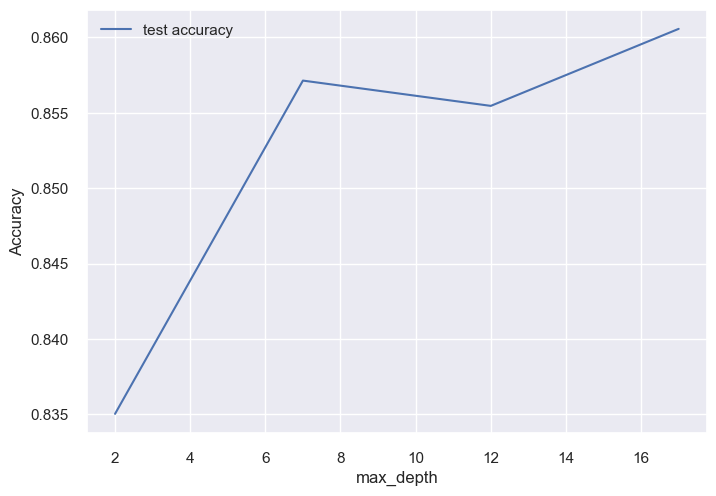

In [290]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

You can see that as we increase the value of max_depth versus test scores increase till a point, but after that test score starts to decrease.

Thus, controlling the depth of the constituent trees will help reduce overfitting in the forest.

## Grid Search to Find Optimal Hyperparameters

We can now find the optimal hyperparameters using GridSearchCV.

In [291]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [4,8,10],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100,200, 300], 
    'max_features': [5, 10]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1)

In [292]:
# Fit the grid search to the data
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [4, 8, 10], 'max_features': [5, 10],
                         'min_samples_leaf': range(100, 400, 200),
                         'min_samples_split': range(200, 500, 200),
                         'n_estimators': [100, 200, 300]},
             verbose=1)

In [293]:
# printing the optimal accuracy score and hyperparameters
accuracy = '{:.4f}'.format(grid_search.best_score_)
print('We can get accuracy of', accuracy, 'using', grid_search.best_params_)

We can get accuracy of 0.8316 using {'max_depth': 4, 'max_features': 5, 'min_samples_leaf': 100, 'min_samples_split': 200, 'n_estimators': 100}


**Fitting the final model with the best parameters obtained from grid search.**

In [294]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=10,
                             min_samples_leaf=100, 
                             min_samples_split=200,
                             max_features=10,
                             n_estimators=100)

In [295]:
# fit
rfc.fit(X_train,y_train)

RandomForestClassifier(max_depth=10, max_features=10, min_samples_leaf=100,
                       min_samples_split=200)

In [296]:
# predict
predictions = rfc.predict(X_test)

In [297]:
# evaluation metrics
from sklearn.metrics import classification_report,confusion_matrix

In [298]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           1       0.00      0.00      0.00        39
           2       0.87      1.00      0.93       255

    accuracy                           0.87       294
   macro avg       0.43      0.50      0.46       294
weighted avg       0.75      0.87      0.81       294



In [299]:
cm = metrics.confusion_matrix(y_test, y_pred)
print(cm)

[[  8  31]
 [ 17 238]]


In [300]:
(8+238)/(8+238+17+31)

0.8367346938775511

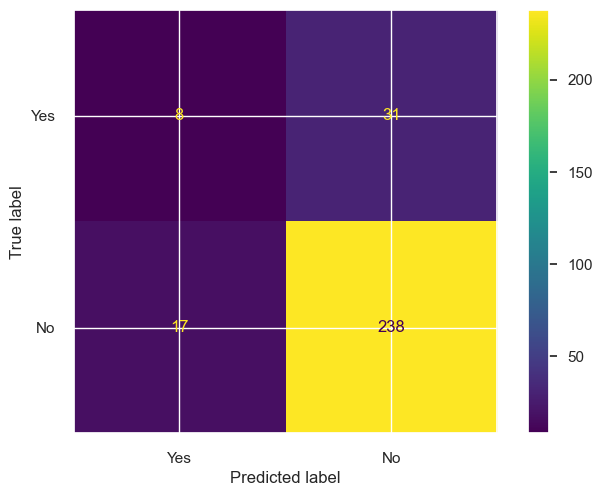

In [301]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classesMapped)

disp.plot()
plt.show()

# Evaluation Metrics SVM Vs RF

In [150]:
print('Evaluation Metrics SVM\n\n',df_svm)
print('\n',cf_svm)
print('\nEvaluation Metrics RF\n\n',df_rf)
print('\n',cf_rf)

Evaluation Metrics SVM

   Split  Accuracy Score  K-Fold CV
0   30%            0.78       0.85
1   20%            0.80       0.85
2   10%            0.79       0.84

   Split  TP   TN  FN Type II Error  FP Type I Error
0   30%  26  318                62               35
1   20%  17  218                37               22
2   10%  11  105                19               12

Evaluation Metrics RF

   Split  Accuracy Score  K-Fold CV
0   30%            0.80       0.86
1   20%            0.80       0.85
2   10%            0.78       0.86

   Split  TP   TN  FN Type II Error  FP Type I Error
0   30%  30  321                59               31
1   20%  19  217                38               20
2   10%  11  104                20               12


#  LDA Vs PCA

# PCA 
PCA is an unsupervised method and it only takes into account the independent variables (features) to reduce the dimensions of the data.

In [87]:
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import LabelEncoder

In [43]:
pca = PCA().fit(X)

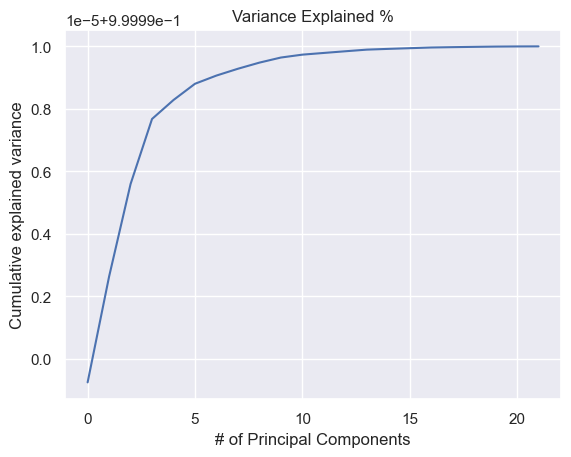

In [44]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('# of Principal Components')
plt.ylabel('Cumulative explained variance')
plt.title('Variance Explained %');

In [144]:
pca2 = PCA(n_components=3)
pca2.fit(X)
X_pca = pca2.transform(X)

print('Original Shape {}'.format(X.shape))
print('Transformed Shape {}'.format(X_pca.shape))

Original Shape (1470, 22)
Transformed Shape (1470, 3)


In [145]:
print(pca2.explained_variance_)

(2.21649303e+07 + 7.50713052e+01 + 6.56215482e+01)

[2.21649303e+07 7.50713052e+01 6.56215482e+01]


22165070.9928534

In [146]:
total_var = np.sum(pca2.explained_variance_)
print(X_pca, total_var)

[[-5.09931923e+02  1.27928921e+00 -8.73005973e+00]
 [-1.37291618e+03  1.29525022e+01 -3.01453003e+00]
 [-4.41293701e+03  1.36827222e+00 -8.01197168e+00]
 ...
 [-3.60949025e+02 -1.15417029e+01 -3.42920730e+00]
 [-1.11290841e+03  1.43147676e+01 -9.37934632e+00]
 [-2.09894061e+03 -2.79365604e+00 -1.07016704e+00]] 22165070.953770965


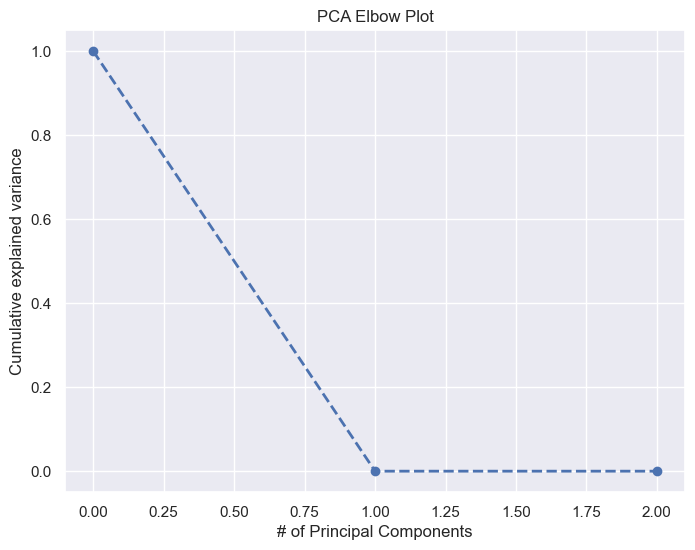

In [147]:
pca2 = PCA(n_components=3)
pca2.fit(X)

fig, ax0 = plt.subplots(nrows=1, sharex=True, figsize=(8, 6))
ax0.plot(pca2.explained_variance_ratio_, linewidth=2, marker='o', linestyle='--')
ax0.set_ylabel('Cumulative explained variance')
plt.xlabel('# of Principal Components')
plt.title('PCA Elbow Plot')
plt.show()

##### Performing PCA on the 'X' independent variable to reduce its dimensionality to 3 components while considering the 'y' target variable

In [222]:
pca1 = PCA(n_components=3)
X_pca1 = pca1.fit_transform(X, y)
X_pca1

array([[-5.09931923e+02,  1.27928921e+00, -8.73005972e+00],
       [-1.37291618e+03,  1.29525023e+01, -3.01453006e+00],
       [-4.41293701e+03,  1.36827213e+00, -8.01197157e+00],
       ...,
       [-3.60949025e+02, -1.15417029e+01, -3.42920732e+00],
       [-1.11290841e+03,  1.43147675e+01, -9.37934627e+00],
       [-2.09894061e+03, -2.79365605e+00, -1.07016702e+00]])

In [223]:
pca1.explained_variance_

array([2.21649303e+07, 7.50713052e+01, 6.56215482e+01])

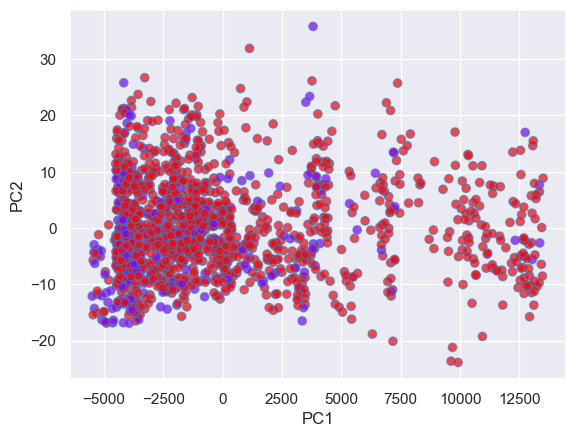

In [224]:
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.scatter(
    X_pca1[:,0],
    X_pca1[:,1],
    c=y,
    cmap='rainbow',
    alpha=0.7,
    edgecolors='b'
);

# LDA
In general, the target variable 'y' is required when performing LDA because LDA is a supervised learning algorithm that needs to know the class labels of the data points to find the optimal linear discriminant vectors.

* https://machinelearningmastery.com/linear-discriminant-analysis-for-machine-learning/
* https://www.javatpoint.com/linear-discriminant-analysis-in-machine-learning

In [182]:
print('Unique values in the target variable',df['Attrition'].unique())

Unique values in the target variable ['Yes' 'No']


In [198]:
lda = LinearDiscriminantAnalysis(n_components=1)
X_lda = lda.fit_transform(X, y)
X_lda

# ValueError: n_components cannot be larger than min(n_features, n_classes - 1).

array([[ 1.23302358],
       [-1.27449311],
       [ 1.66980486],
       ...,
       [ 0.94814601],
       [-0.95985263],
       [-0.60909248]])

In [199]:
print(X_lda.shape)

(1470, 1)


We can access the following property to obtain the variance explained by each component.

In [200]:
lda.explained_variance_ratio_

array([1.])

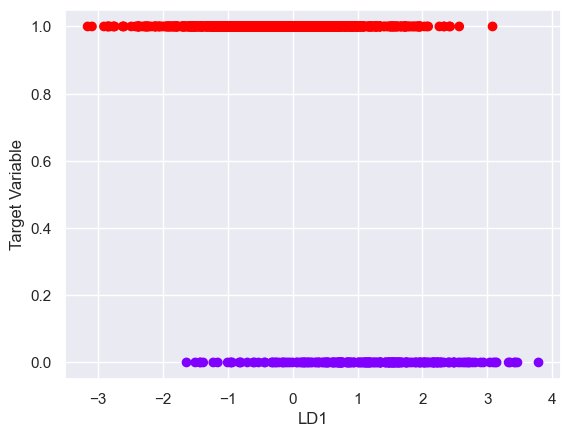

In [201]:
lda = LinearDiscriminantAnalysis(n_components=1)
X_lda = lda.fit_transform(X, y)

# Plot the transformed data
plt.scatter(X_lda, y, c=y, cmap='rainbow')
plt.xlabel('LDA1')
plt.ylabel('Target Variable')
plt.show()

# ValueError: n_components cannot be larger than min(n_features, n_classes - 1).

Next, let’s see whether we can create a model to classify the using the LDA components as features. First, we split the data into training and testing sets.

##### LDA 

In [228]:
X_train, X_test, y_train, y_test = train_test_split(X_lda, y, random_state=42)

Then, we build and train a Random Forest. After predicting the category of each sample in the test set, we create a confusion matrix to evaluate the model’s performance.

In [229]:
rf_lda = RandomForestClassifier()
rf_lda.fit(X_train, y_train)

y_pred = rf_lda.predict(X_test)
confusion_matrix(y_test, y_pred)

array([[ 19,  29],
       [ 26, 294]], dtype=int64)

In [230]:
# LDA Evidence
rf_lda.score(X_test, y_test)

0.8505434782608695

In [1]:
(19+294)/(19+294+26+29)

0.8505434782608695

##### PCA 

In [231]:
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, random_state=42)

In [232]:
rf_pca = RandomForestClassifier()
rf_pca.fit(X_train, y_train)

y_pred = rf_pca.predict(X_test)
confusion_matrix(y_test, y_pred)

array([[  3,  45],
       [ 12, 308]], dtype=int64)

In [233]:
# LDA Evidence
rf_pca.score(X_test, y_test)

0.845108695652174

In [2]:
(3+308)/(3+308+12+45)

0.845108695652174